# Leon Wu 01190736
# Data Science Coursework 3

# Part 1

## Preliminaries

In [1]:
# All Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.offsetbox import OffsetImage
from matplotlib.offsetbox import AnnotationBbox
import seaborn as sns
from operator import itemgetter
sns.set()

!pip install https://github.com/scikit-learn-contrib/scikit-learn-extra/archive/master.zip
import sklearn
import sklearn.svm as svm
from sklearn.model_selection import StratifiedKFold
from sklearn.datasets import fetch_openml
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.model_selection import train_test_split
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import calinski_harabasz_score as CH_score
from sklearn.metrics import davies_bouldin_score as DB_score
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score,\
     precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score,\
     precision_score, recall_score, f1_score
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score

from scipy.cluster.hierarchy import dendrogram
import scipy.ndimage
import networkx as nx
from networkx.algorithms.community.modularity_max import greedy_modularity_communities as CNM

import torch
import torch.nn as nn
import torch.utils.data
import torch.nn.functional as F
from torchvision.transforms.functional import resize

from google.colab import drive
import time
from collections import Counter

     | 1.3MB 239.3MB/s
    Complete output from command python setup.py egg_info:
    Traceback (most recent call last):
      File "<string>", line 1, in <module>
      File "/tmp/pip-6g2yxyr9-build/setup.py", line 11, in <module>
        from Cython.Build import cythonize
    ModuleNotFoundError: No module named 'Cython'
    
    ----------------------------------------
Command "python setup.py egg_info" failed with error code 1 in /tmp/pip-6g2yxyr9-build/


ModuleNotFoundError: No module named 'sklearn_extra'

---
---
# Task 1: Unsupervised learning: text documents with citation graph
---
---


## Introduction
---
This first dataset is comprised of journal papers, represented as a vector of p features, with each feature a representing whether or not a word exists in the each paper, and also as an undirected graph in the form of an adjacency matrix. This project will explore the closeness and importance of documents using various unsupervised and supervised learning techniques.

## 1.1 Clustering of the feature matrix
---
- The aim of unsupervised clustering of data is to find groups that partition the samples, such that points in a group are more similar to eachother than points from different groups.
- More formally, let N be the number of sample and K the number of clusters. The aim is to minimize
$$ Trace \Big[ (H^TH)^{-1} [H^TDH] \Big]
$$
where H is the NxK assigment matrix mapping each sample to one of k clusters, and D is the NxN distance (or measure of 'closeness') matrix between all the samples. The elements on the diagonals of the KxK matrix $[H^TDH]$ correspond to the sums of the distances between all points within the same cluster, so that the sum of these distances is minimized. $(H^TH)^{-1}$ is used to normalize the diagonals of the matrix $[H^TDH]$ using the sizes of the groups.


### K-means Algorithm
- Complete enumeration in order to find this global minimum is not computationally feasible for any sufficiently large dataset.
- The K-means algorithm uses a heuristic to reduce the computational cost of finding a solution (but not necessarily the global solution) to this problem.
- The algorithm starts by randomly assinging each sample to one of the k clusters. At each iteration until convergence, each sample is reassigned to the cluster whose centroid is closest to the sample.
- The algorithm will terminate when some condition is met, such as when the clustering doesn't change between iterations or after a set number of iterations is reached.


### Measures of 'closeness' between samples
- There needs to be decisions made about how to define '**closeness**' between points, and **how many groups** to split samples into.
- Measures of similarity/dissimilarity to consider:
    - Euclidean
    - Manhattan Distance
    - Cosine similarity (measure of vector alignment)
    - Correlation

- The **euclidean distance** will be used in this example, although the other distances could be considered. The sklearn implementation of K-Means uses the Euclidean distance so it is also convenient to use.

### Choosing the number of clusters, k
- A range of values for k will be tested. The aim is to find the value of k for which the clustering is optimal by some metric/metrics.

In [119]:
# Load data from my drive into dataframes
drive.mount("/content/drive/")
feat_mat = pd.read_csv("/content/drive/My Drive/A50/CW3/feature_matrix.csv", header=None, dtype=int)

feat_mat.head()

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,1393,1394,1395,1396,1397,1398,1399,1400,1401,1402,1403,1404,1405,1406,1407,1408,1409,1410,1411,1412,1413,1414,1415,1416,1417,1418,1419,1420,1421,1422,1423,1424,1425,1426,1427,1428,1429,1430,1431,1432
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


#### Calinski-Harabasz Score
- The Calinski-Harabasz score takes into account the dispersion within clusters and dispersion between clusters, so that tight clusters that are far away from eachother score well. 
- A higher score is better - more will be said about this score later.

#### Davies-Bouldin Score
- The Davies-Bouldin score is similar to the Calinski-Harabasz score except it tends to score clusters equally-distanced from eachother highly, in comparison to clusters of approximately the same size as in the Calinsky-Harabasz. A lower score is better.


#### Inertia
- Inertia is the cost function that k-means uses, ie. the sum of squared distances of all samples from their closest cluster centroid.

In [3]:
# Toggle on/off printing
verbose = True

# Setup list of numbers of clusters and metrics
k_values = np.linspace(2, 30, 28, dtype=int)
CH = []
DB = []
inertia = []
X = feat_mat

for k in k_values:
    if verbose: print(f'Running k-means for k={k}')
    # Use K-means algorithm to cluster papers with k clusters
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X)

    # Store Calinski-Harabasz score
    CH.append(CH_score(X, kmeans.labels_))
    # Store Davies-Bouldin Score
    DB.append(DB_score(X, kmeans.labels_))
    # Store Inertia
    inertia.append(kmeans.inertia_)

# Compute Optimal value for k
k_optimal = k_values[next(i for i,x in enumerate(CH) if x<7)]

Running k-means for k=2
Running k-means for k=3
Running k-means for k=4
Running k-means for k=5
Running k-means for k=6
Running k-means for k=7
Running k-means for k=8
Running k-means for k=9
Running k-means for k=10
Running k-means for k=11
Running k-means for k=12
Running k-means for k=13
Running k-means for k=14
Running k-means for k=15
Running k-means for k=16
Running k-means for k=17
Running k-means for k=18
Running k-means for k=19
Running k-means for k=20
Running k-means for k=21
Running k-means for k=22
Running k-means for k=23
Running k-means for k=24
Running k-means for k=25
Running k-means for k=26
Running k-means for k=27
Running k-means for k=28
Running k-means for k=30


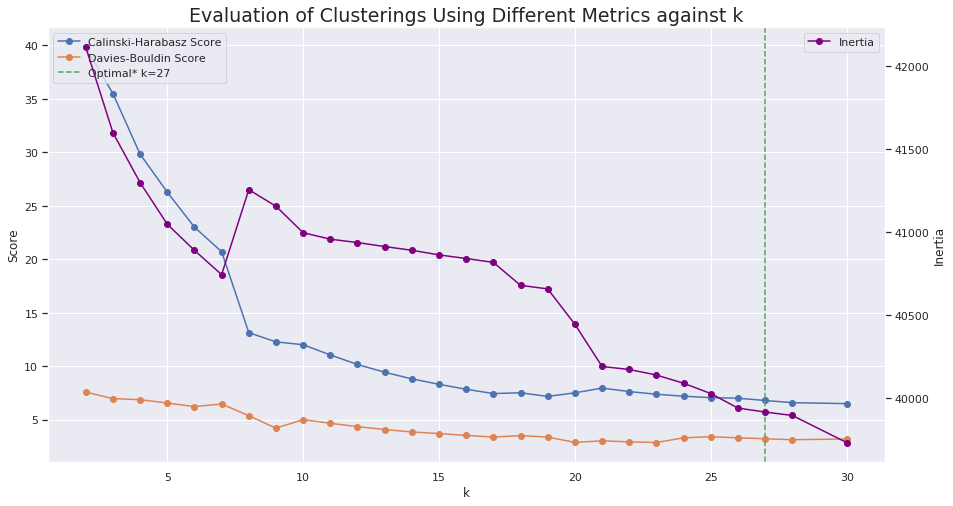

In [0]:
# Begin plot
fig, ax1 = plt.subplots(1, 1, figsize=(15,8))
ax2 = ax1.twinx()

# Plot graphs against values of k
ax1.plot(k_values, CH, marker='o', label='Calinski-Harabasz Score')
ax1.plot(k_values, DB, marker='o', label='Davies-Bouldin Score')
ax2.plot(k_values, inertia, marker='o', color='purple', label='Inertia')
ax1.set_title(f'Evaluation of Clusterings Using Different Metrics against k', fontsize=19)

# Plot vertical line for optimal k value
ax1.axvline(x=k_optimal, linestyle='dashed', color='g', label=f'Optimal* k={k_optimal}')
ax1.legend(loc='upper left')
ax2.legend()

ax1.set_xlabel('k')
ax1.set_ylabel('Score')
ax2.set_ylabel('Inertia')
ax2.grid(False)

plt.show()

- As k increases, we see that the Davies-Bouldin score decreases signifying that the clustering is better, ie the clusters are tighter and/or more well separated between clusters. For $k > 20$, the score don't reduce much after this, which suggests splitting into more clusters doesn't provide a significantly better clustering.

- Also, the Calinski-Harabasz score decreases, which means that actually the clustering gets worse as k increases according to this metric. However this score is expected to decrease as k increases, and this score will be discussed more later on.

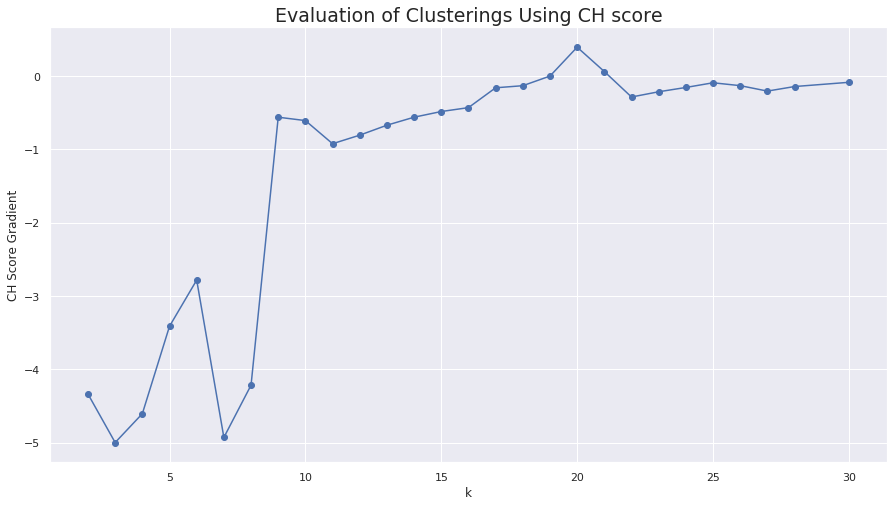

In [0]:
CH_grad = np.gradient(CH)
k_optimal_alt = np.argmax(CH_grad) + 2
# Begin plot
fig, ax1 = plt.subplots(1, 1, figsize=(15,8))

# Plot graph against values of k
ax1.plot(k_values, CH_grad, marker='o', label='Calinski-Harabasz Score Gradient')
ax1.set_title(f'Evaluation of Clusterings Using CH score', fontsize=19)

ax1.set_xlabel('k')
ax1.set_ylabel('CH Score Gradient')

plt.show()

- The above figure would suggest that a value of 9 (where the gradient of the CH score rapidly increases) or 20 (where the gradient is at its maximum) would be valid choices for an optimum value of k, as alluded to in the original paper by Calinski and Harabasz.

## Analysis of the Optimal Clustering Performance
- Note that there is no 'ground-truth' labels in order to test the clustering against, so no metrics that use these labels can be used. However, there are some measures of performance that don't use ground truth labels:

### Silhouette Coefficient
- The Silhouette coefficient is bounded between -1 and 1, with a higher score indicating a better clustering with dense and well-separated clusters. It uses the distance between samples and other points in the same cluster, as well as the distance between samples and other points in the next nearest cluster.

- The silhouette plot shows how close each point in each cluster to points in nearby clusters. It provide a way to visualize the quality of clusters. The aim is to find a clustering that provides clusters with similar and high silhouette scores. For this we can use the silhouette score, which is the average silhouette coefiicient across all k clusters.

Text(0.5, 0.98, 'Silhouette Plots for varying k')

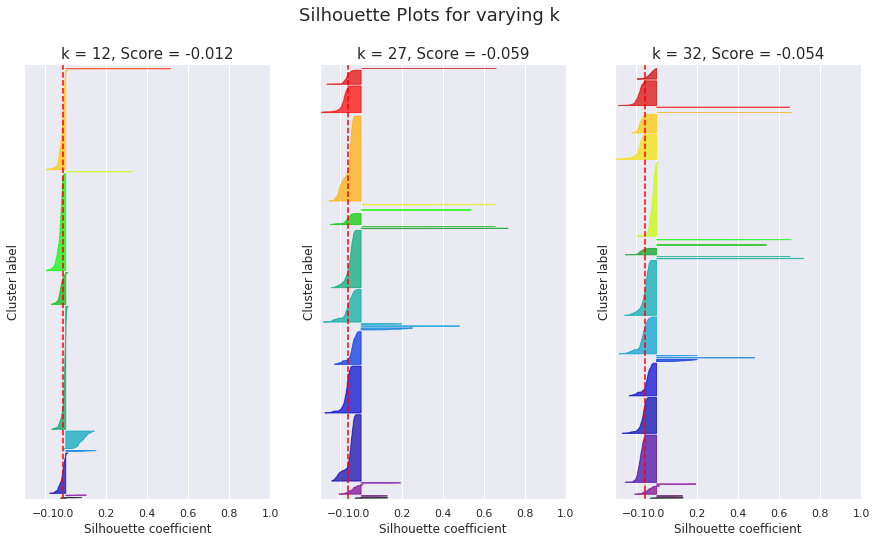

In [0]:
k_plot_list = [12, k_optimal, k_optimal+5]
fig, axes = plt.subplots(1, len(k_plot_list), figsize=(15,8))
X = feat_mat

for j, k in enumerate(k_plot_list):
    # Initialize the silhouette plot
    axes[j].set_xlim([-0.2, 1])
    axes[j].set_ylim([0, len(X) + (k + 1) * 10])

    # Cluster using k-means with
    kmeans = KMeans(n_clusters=k, n_init=1, random_state=42)
    kmeans.fit(X)
    cluster_labels = kmeans.predict(X)

    # Compute average silhouette score
    silhouette_avg = silhouette_score(X, cluster_labels)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(k):
        # Aggregate the silhouette scores
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / k)
        axes[j].fill_betweenx(np.arange(y_lower, y_upper),
                            0, ith_cluster_silhouette_values,
                            facecolor=color, edgecolor=color, alpha=0.7)

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    axes[j].set_title(f"k = {k}, Score = {round(silhouette_avg, 3)}", fontsize=15)
    axes[j].set_xlabel("Silhouette coefficient")
    axes[j].set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    axes[j].axvline(x=silhouette_avg, color="red", linestyle="--")

    axes[j].set_yticks([])  # Clear the yaxis labels / ticks
    axes[j].set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

fig.suptitle('Silhouette Plots for varying k', fontsize=18)
# Reference: sklearn's example for silhouette plots

- From the silhouette plots, we can see that actually the silhouette scores are quite low (values around 0 (or even below 0) suggest that the clusters are not very good), suggesting that the clusters are not very well-separated. Varying k also doesn't seem to yield significantly between clusterings.

- The plots themselves show a lot of variation in the size of the plots and also their are many clusters with a score below the average score. This suggests that perhaps the clusters are not that well-defined and it is hard to cluster this data well, or maybe that the threshold=7 for the CH score is not optimal.

#### Distribution of Cluster Sizes
- The distribution of cluster sizes is now plotted as a histogram:

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 4.0, 4.0, 4.0, 14.0, 61.0, 71.0, 90.0, 170.0, 209.0, 209.0, 299.0, 365.0, 423.0, 541.0]


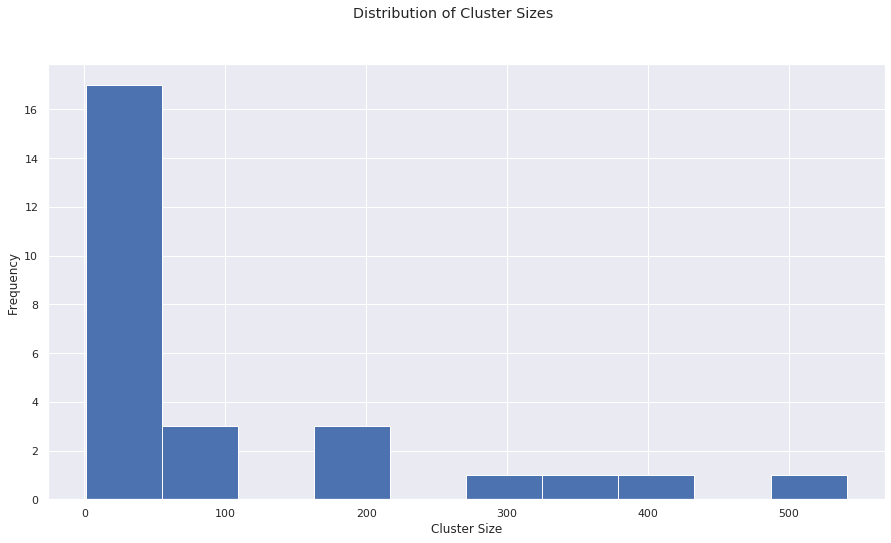

In [0]:
# Train optimal model
kmeans = KMeans(n_clusters=k_optimal, init='k-means++', n_init=10, random_state=42)
kmeans.fit(X)

# Plot cluster size distribution
cluster_sizes = np.zeros(k_optimal)
cluster_labels = kmeans.predict(X)
for i in range(k_optimal):
    cluster_sizes[i] = int(cluster_labels[cluster_labels == i].shape[0])

fig, ax = plt.subplots(figsize=(15,8))
ax.hist(cluster_sizes)
fig.suptitle('Distribution of Cluster Sizes')
ax.set_xlabel('Cluster Size')
ax.set_ylabel('Frequency')
print(sorted(cluster_sizes))

- There are many small cluster with fewer than 10 items in each, which suggests that maybe there should be fewer clusters. It could also suggest that these are outliers, and a clustering method that handles outliers better than K-Means should be considered; K-Medoids for example.

#### Within Groups / Across Group Similarity
- The within and across group dispersion is calcualted as in the Calinski-Harabasz score, which uses the mean of the clusters and of all the points for its calculations:

In [0]:
extra_disp, intra_disp = 0., 0.
mean = np.mean(X, axis=0)
for k in range(k_optimal):
    cluster_k = np.array(X[cluster_labels == k])
    cluster_k = cluster_k[0, :]
    mean_k = np.mean(cluster_k, axis=0)
    extra_disp += len(cluster_k) * np.sum((mean_k - mean) ** 2)
    intra_disp += np.sum((cluster_k - mean_k) ** 2)

### Final model metrics

In [0]:
# Populate table (training)
df_table = pd.DataFrame(columns=['', f'k_optimal={k_optimal}'])
df_table.loc[0] = ['CH Score', round(CH_score(X, kmeans.labels_), 3)]
df_table.loc[1] = ['DB Score', round(DB_score(X, kmeans.labels_), 3)]
df_table.loc[2] = ['Silhouette Score', round(silhouette_score(X, kmeans.labels_), 3)]
df_table.loc[3] = ['Within Group Dispersion', round(intra_disp, 1)]
df_table.loc[4] = ['Across Group Dispersion', round(extra_disp, 1)]
df_table

,,k_optimal=27
0,CH Score,6.794
1,DB Score,3.217
2,Silhouette Score,-0.059
3,Within Group Dispersion,558.300
4,Across Group Dispersion,33741.700


### Final Thoughts:
- **From the low scoring silhouette plots, the skewed distribution of cluster sizes and the CH score gradient plot, it seems as if a more optimal clustering might be less than what was calculated as the 'optimal' clustering as per the assignment by choosing the first clustering with CH score < 7.**

### Randomness in K-means clustering
- As mentioned before, the K-means is not likely to converge to the global minimum, and so it will likely converge to just a local minimum. The algorithm is sensitive to the initial random clustering of the points, and will likely yield different results each time it is run.

- **In order to account for this, the algorithm can be run many times, and the best clustering is then chosen. This is acheived using the n_init parameter in sklearn's K-Means implementation. In the above case, n_init is set to 10 be default.**

- If the outcomes are similar, it could be an indication that your outcomes are 'good', whereas if there is a lot of variance in the outcomes, it could indicate that k-means might not be the best algorithm with which to cluster this datset.

- 'k-means++' can also be used, which chooses the initial clustering in a better way. This is likely to decrease the variance of the models for different random seeds. Note that this alteration is used by default by sklearn.

**- A graph is now plotted to show how the value of n_init affects the best model chosen:**


Running k-means for n_init=1
Running k-means for n_init=3
Running k-means for n_init=5
Running k-means for n_init=7
Running k-means for n_init=9
Running k-means for n_init=12
Running k-means for n_init=14
Running k-means for n_init=16
Running k-means for n_init=18
Running k-means for n_init=21
Running k-means for n_init=1
Running k-means for n_init=3
Running k-means for n_init=5
Running k-means for n_init=7
Running k-means for n_init=9
Running k-means for n_init=12
Running k-means for n_init=14
Running k-means for n_init=16
Running k-means for n_init=18
Running k-means for n_init=21


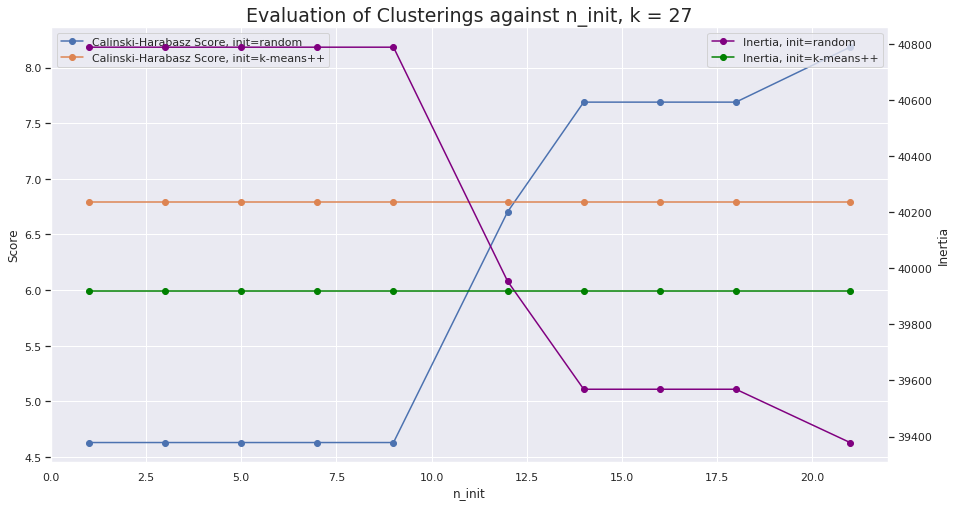

In [0]:
# Toggle on/off printing
verbose = True

# Setup list of numbers of clusters and metrics
n_init_values = np.linspace(1, 21, 10, dtype=int)
CH = []
inertia = []
CH2 = []
inertia2 = []

init = 'random'
for n_init in n_init_values:
    if verbose: print(f'Running k-means for n_init={n_init}')
    # Use K-means algorithm
    kmeans = KMeans(n_clusters=k_optimal, init=init, n_init=n_init, random_state=42)
    kmeans.fit(X)

    # Store Calinski-Harabasz score
    CH.append(CH_score(X, kmeans.labels_))
    # Store Inertia
    inertia.append(kmeans.inertia_)
    
init = 'k-means++'
for n_init in n_init_values:
    if verbose: print(f'Running k-means for n_init={n_init}')
    # Use K-means algorithm
    kmeans = KMeans(n_clusters=k_optimal, init=init, n_init=n_init, random_state=42)
    kmeans.fit(X)

    # Store Calinski-Harabasz score
    CH2.append(CH_score(X, kmeans.labels_))
    # Store Inertia
    inertia2.append(kmeans.inertia_)
    
# Begin plot
fig, ax1 = plt.subplots(1, 1, figsize=(15,8))
ax2 = ax1.twinx()

# Plot graphs against values of n_init
ax1.plot(n_init_values, CH, marker='o', label='Calinski-Harabasz Score, init=random')
ax1.plot(n_init_values, CH2, marker='o', label='Calinski-Harabasz Score, init=k-means++')
ax2.plot(n_init_values, inertia, marker='o', color='purple', label='Inertia, init=random')
ax2.plot(n_init_values, inertia2, marker='o', color='green', label='Inertia, init=k-means++')
ax1.set_title(f'Evaluation of Clusterings against n_init, k = {k_optimal}', fontsize=19)

ax1.set_xlabel('n_init')
ax1.set_ylabel('Score')
ax2.set_ylabel('Inertia')
ax1.legend()
ax2.legend()
ax2.grid(False)

plt.show()

- From the figure, it can be seen that above around n_init = 13 the extra attempts don't yield a significantly better clustering. Hence the used value of n_init=15 used below is sufficently high for a good clustering without too high a computational cost.

- A graph is also plotted to show how the best clusters are scored relative to n_init and k:

Running k-means for k=2
Running k-means for k=5
Running k-means for k=8
Running k-means for k=11
Running k-means for k=14
Running k-means for k=17
Running k-means for k=20
Running k-means for k=23
Running k-means for k=26
Running k-means for k=30
Running k-means for k=2
Running k-means for k=5
Running k-means for k=8
Running k-means for k=11
Running k-means for k=14
Running k-means for k=17
Running k-means for k=20
Running k-means for k=23
Running k-means for k=26
Running k-means for k=30
Running k-means for k=2
Running k-means for k=5
Running k-means for k=8
Running k-means for k=11
Running k-means for k=14
Running k-means for k=17
Running k-means for k=20
Running k-means for k=23
Running k-means for k=26
Running k-means for k=30


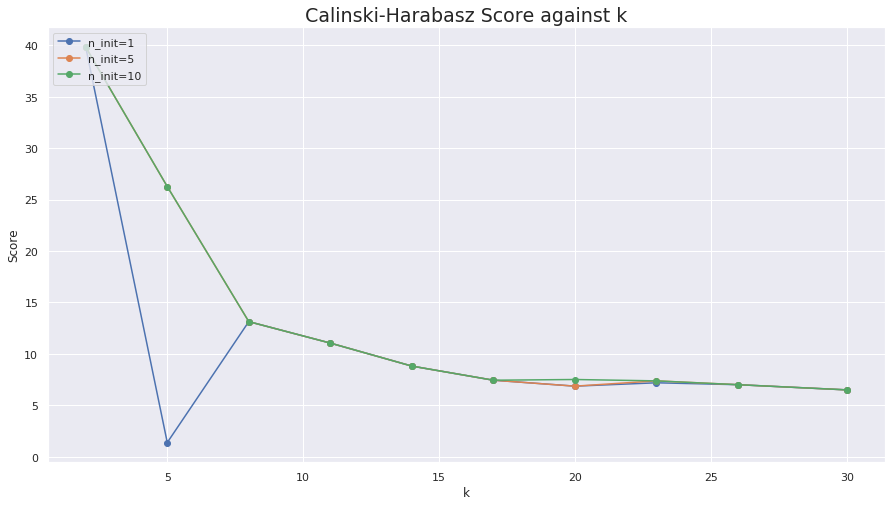

In [0]:
# Setup list of numbers of clusters and metrics
k_values = np.linspace(2, 30, 10, dtype=int)
n_init_values = [1, 5, 10]

 # Begin plot
fig, ax1 = plt.subplots(1, figsize=(15,8))
for n_init in n_init_values:
    CH = []
    for k in k_values:
        if verbose: print(f'Running k-means for k={k}')
        # Use K-means algorithm to cluster papers with k clusters
        kmeans = KMeans(n_clusters=k, n_init=n_init, random_state=42)
        kmeans.fit(X)

        # Store Calinski-Harabasz score
        CH.append(CH_score(X, kmeans.labels_))

    # Plot graphs against values of k
    ax1.plot(k_values, CH, marker='o', label=f'n_init={n_init}')

ax1.set_title(f'Calinski-Harabasz Score against k', fontsize=19)
ax1.legend(loc='upper left')
ax1.set_xlabel('k')
ax1.set_ylabel('Score')

plt.show()

- Repetitions of k-means for low k is more effective at finding a good clustering, so it may be more sensible to observe the n_init=1 graph, or at least be aware of the correlation between n_init and the CH score for a given number of clusters. Given enough repeats, high values of k can also be optimized in the same way. This is seen for low k: The distance between the three plotted lines is greater than that for large k.

### Outlier Sensitivity 
- K-means senstive to outliers because of how centroids are calculated as the mean of all the samples in the respective cluster. This can be combatted using data exploration (this is hard with many dimensions), or extensions to kmeans.

- K-medoids can be used, which assigns one of the points within the cluster to be the 'center', choosing the point which is most representative of the cluster.

## 1.2 Analysis of the citation graph
---

#### Graphs
Each of the samples is represented as a node in a graph. The edges that connect nodes represent  the similarities that exist between the nodes or samples. A graph can be constructed from the adjacency matrix. 

- The aim of clustering graphs is to find the relabelling of nodes such that the adjancancy matrix is as blcok diagonal as possible.

- The distances between nodes for graphs can be calculated in multiple ways: 
    - Geodisic distance between nodes (undirected graph) (minimum number of edges for all paths connected two nodes)
    - Average number of edges across all paths between all nodes
<!-- 
In order to make a graph that is more sparse than a fully connected graph, a few things methods can be considered:
Introduce a **tolerance**, such that any weight between nodes under this tolerance is set to 0 and the nodes are not connected. In practice this method is shown not to be very good.
Construct a **geometric graph**, using an $\epsilon$-ball, or KNN methodology. DO THESE:
The $\epsilon$-ball uses a local threshold for each node to connect other nodes to it. With this methodology, points which are quite close, but not within epsilon, of eachother in (other space) can be very far from eachother in the graph.
The KNN methodoloy links each node to its k nearest neighbours, such that the degree of all nodes is k. This methodology doesn't capture 'gaps' in the data, since two points on the edges of gaps will be connected?? since fixed k... -->

In [107]:
# Load data from my drive into dataframes
drive.mount("/content/drive/")
adj_mat = pd.read_csv("/content/drive/My Drive/A50/CW3/adjacency_matrix.csv", header=None, dtype=int)

adj_mat.head()

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,2445,2446,2447,2448,2449,2450,2451,2452,2453,2454,2455,2456,2457,2458,2459,2460,2461,2462,2463,2464,2465,2466,2467,2468,2469,2470,2471,2472,2473,2474,2475,2476,2477,2478,2479,2480,2481,2482,2483,2484
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


- The citation graph is now plotted from the adjacency matrix:

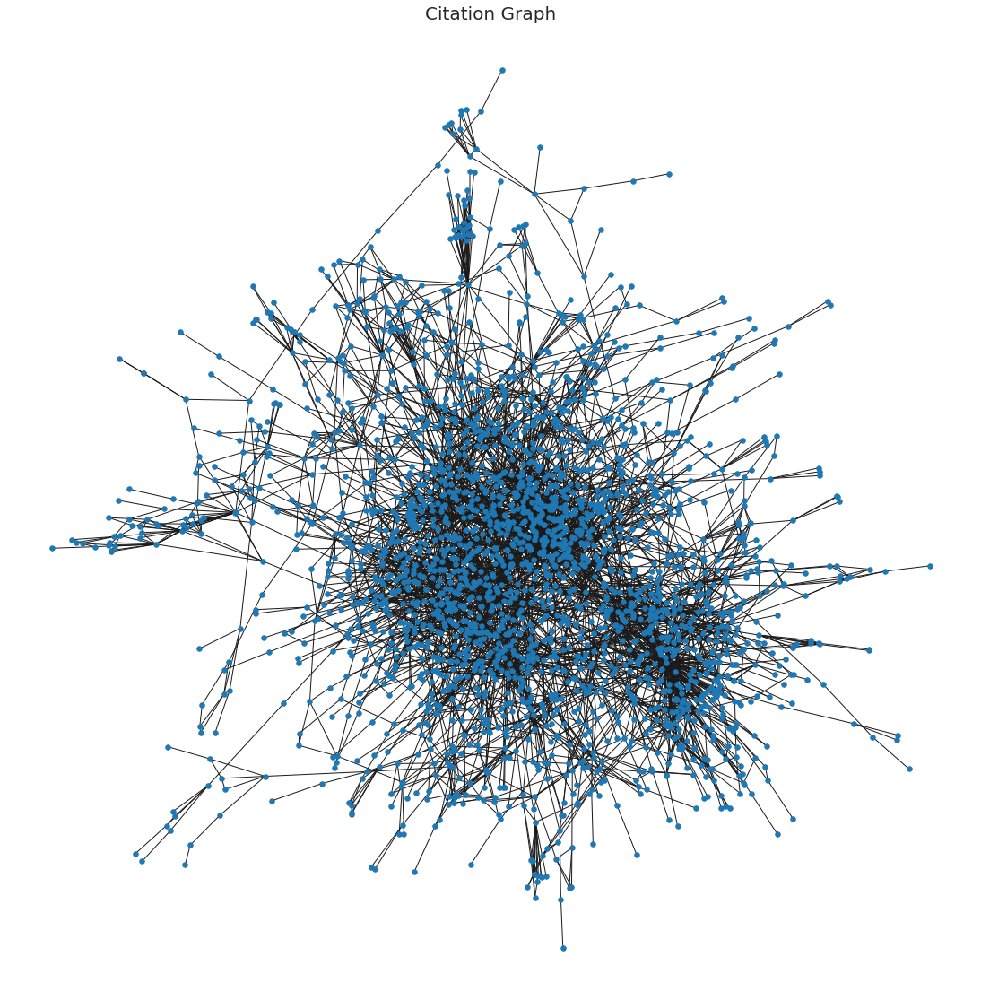

In [108]:
# convert graph from adjacency matrix
g1 = nx.convert_matrix.from_pandas_adjacency(adj_mat)

# plot the graph
plt.figure(figsize=(15,15))
nx.draw(g1, node_size=30)
plt.title('Citation Graph', fontsize=20)
plt.show()

## Node Centrality Measures

#### Degree
- The degree of a node is the number of edges it has. If a node has a high degree, it could be considered important, since in this case, the paper is cited a lot, or uses a lot of citations (or both).
- It would be useful to examine the directed graph, since then you could distinguish the **number of citations a paper uses** and the **number of citations that uses this paper**, since for each node you could compute the number of edges both coming in to and out of the node using the direction. However in this case we don't have this information.
- The degree distribution is plotted (Note the y axis log scale):

[(0, 3), (1, 3), (2, 5), (3, 5), (4, 3), (5, 4), (6, 3), (7, 2), (8, 2), (9, 2), (10, 2), (11, 5), (12, 4), (13, 4), (14, 5), (15, 5), (16, 1), (17, 5), (18, 2), (19, 5), (20, 7), (21, 4), (22, 4), (23, 1), (24, 2), (25, 6), (26, 4), (27, 9), (28, 1), (29, 3), (30, 8), (31, 3), (32, 4), (33, 7), (34, 3), (35, 4), (36, 2), (37, 6), (38, 6), (39, 2), (40, 2), (41, 9), (42, 2), (43, 1), (44, 6), (45, 5), (46, 3), (47, 2), (48, 12), (49, 4), (50, 1), (51, 1), (52, 10), (53, 3), (54, 5), (55, 1), (56, 1), (57, 3), (58, 10), (59, 3), (60, 3), (61, 7), (62, 2), (63, 3), (64, 2), (65, 12), (66, 9), (67, 3), (68, 2), (69, 3), (70, 2), (71, 3), (72, 4), (73, 2), (74, 2), (75, 3), (76, 4), (77, 3), (78, 36), (79, 10), (80, 4), (81, 6), (82, 4), (83, 11), (84, 21), (85, 1), (86, 2), (87, 1), (88, 2), (89, 3), (90, 8), (91, 6), (92, 4), (93, 4), (94, 4), (95, 32), (96, 5), (97, 6), (98, 4), (99, 3), (100, 3), (101, 1), (102, 2), (103, 19), (104, 6), (105, 5), (106, 7), (107, 5), (108, 2), (109, 6),

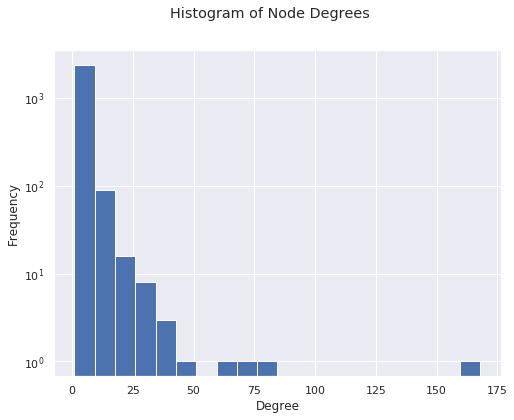

In [0]:
# get degrees of all nodes
degree = g1.degree()
print(degree)
sorted_degree = sorted(degree, key=itemgetter(1), reverse=True)

# plot histograms of degrees
fig, ax = plt.subplots(figsize=(8, 6))
plt.hist([deg[1] for deg in g1.degree()], bins=20)
fig.suptitle('Histogram of Node Degrees')
ax.set_xlabel('Degree')
ax.set_ylabel('Frequency')
plt.yscale('log')
plt.show()

- It can be seen that few papers have a very high degree, which are likely to be papers that are important and are cited a lot by other papers. This is what we expect, since most papers are not well cited, and only a few are cited very often.

- Another graph is now drawn, coloured according to each node's degree:

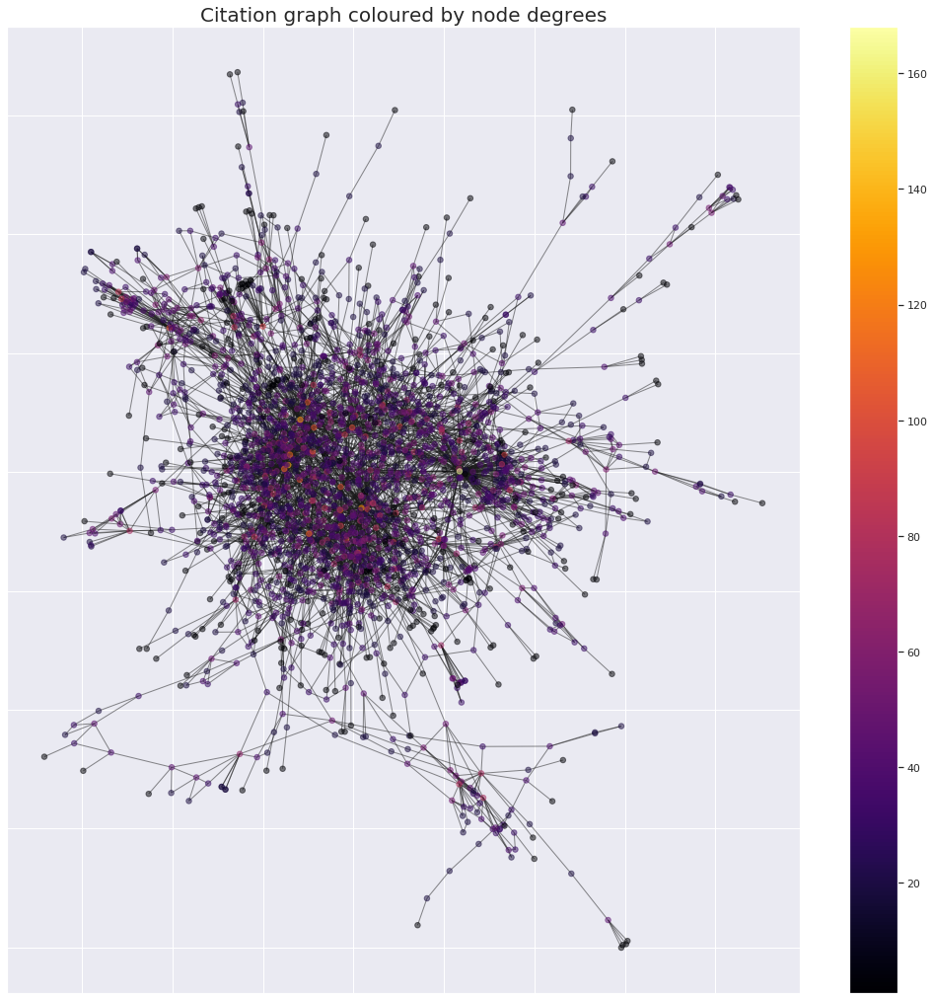

In [0]:
# Plot the graph, colouring nodes by degree
# Fix layout for consistency
pos=nx.spring_layout(g1)
# Degree is scaled to increase node visibility by colours
colors=[deg[1]**0.1 for deg in g1.degree()]
cmap=plt.cm.inferno
vmin = min(colors)
vmax = max(colors)
fig, ax = plt.subplots(figsize=(18,18))
nx.draw_networkx(g1, ax=ax, pos=pos, node_color=colors, cmap=cmap,
           node_size=30, with_labels=False, alpha=0.5, vmin=vmin, vmax=vmax)

# make colourbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin = vmin**10, vmax=vmax**10))
sm._A = []
plt.colorbar(sm)
plt.title('Citation graph coloured by node degrees', fontsize=20)
plt.show()

- It can be seen that the nodes with high degrees are mostly in the center of the figure, with some highly visible nodes with very high degrees in the lighter colours.

#### Betweeness centrality
- The betweeness centrality ranks highly nodes that lie in a lot of paths between nodes. It is calculated by computing all minimum paths between any two nodes in the graph and counting the number of the paths that go through each node.
- Similarly, a histogram is plotted:

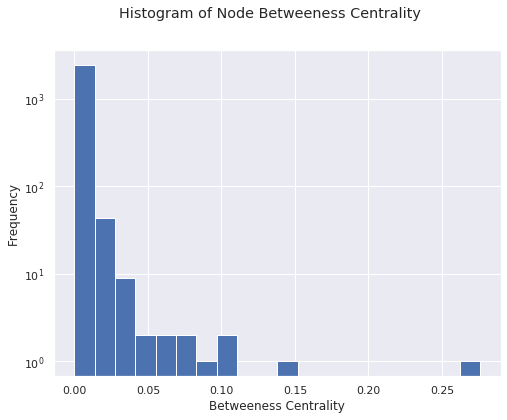

In [6]:
# Compute betweeness centrality for each node
bet_cen = nx.betweenness_centrality(g1)
sorted_bet_cen = sorted(bet_cen.items(), key=itemgetter(1), reverse=True)
nsorted_bet_cen = sorted(bet_cen.items(), key=itemgetter(0), reverse=False)

fig, ax = plt.subplots(figsize=(8, 6))
plt.hist([x[1] for x in nsorted_bet_cen], bins=20)
fig.suptitle('Histogram of Node Betweeness Centrality')
ax.set_xlabel('Betweeness Centrality')
ax.set_ylabel('Frequency')
plt.yscale('log')
plt.show()

# Set as atrribute
# nx.set_node_attributes(g1, bet_cen, 'bet_cen')

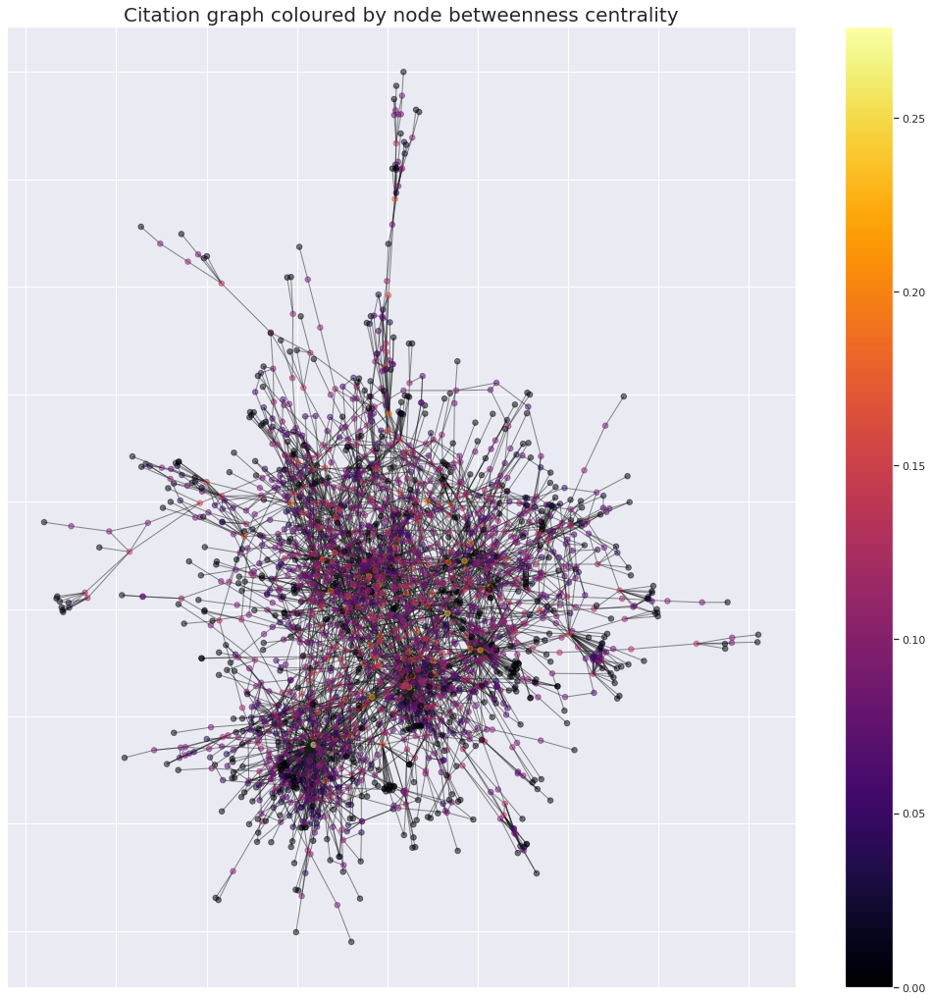

In [7]:
# Plot graph, colouring nodes by betweeness centrality
pos=nx.spring_layout(g1)
# Scale nodes to increase visibility by colouring
colors=[x**0.2 for i,x in bet_cen.items()]
cmap=plt.cm.inferno
vmin = min(colors)
vmax = max(colors)
fig, ax = plt.subplots(figsize=(18,18))
nx.draw_networkx(g1, ax=ax, pos=pos, node_color=colors, cmap=cmap,
           node_size=30, with_labels=False, alpha=0.5, vmin=vmin, vmax=vmax)
# make colourbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin = vmin**5, vmax=vmax**5))
sm._A = []
plt.colorbar(sm)
plt.title('Citation graph coloured by node betweenness centrality', fontsize=20)
plt.show()

- The nodes with a high betweenness centrality score differ slightly from the degree and pagerank score, since it scores highly nodes that are passed through often, which might mean nodes that have a low degree can have a high betweeness centrality score.

- This can be seen in this graph, where some nodes near the extremeties

#### Pagerank
- Pagerank: The pagerank algorithm assigns a centrality measure to each node by performing a kind of random walk, which at every step follows the graph with probabiltiy $\alpha$, and randomly jumps to a different node with probability $(1-\alpha)$,  $0<\alpha<1$. The centrality measure is then the stationary vector of this process.


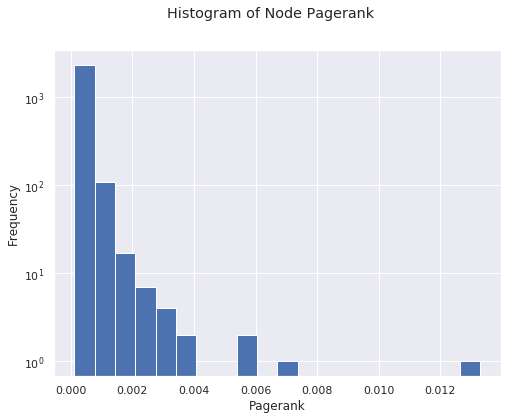

In [0]:
# Make histogram of pagerank
pagerank = nx.pagerank(g1, alpha=0.85)
sorted_pagerank = sorted(pagerank.items(), key=itemgetter(1), reverse=True)
nsorted_pagerank = sorted(pagerank.items(), key=itemgetter(0), reverse=False)

fig, ax = plt.subplots(figsize=(8, 6))
plt.hist([x[1] for x in nsorted_pagerank], bins=20)
fig.suptitle('Histogram of Node Pagerank')
ax.set_xlabel('Pagerank')
ax.set_ylabel('Frequency')
plt.yscale('log')
plt.show()

# Set as atrribute
# nx.set_node_attributes(g1, pagerank, 'pagerank')

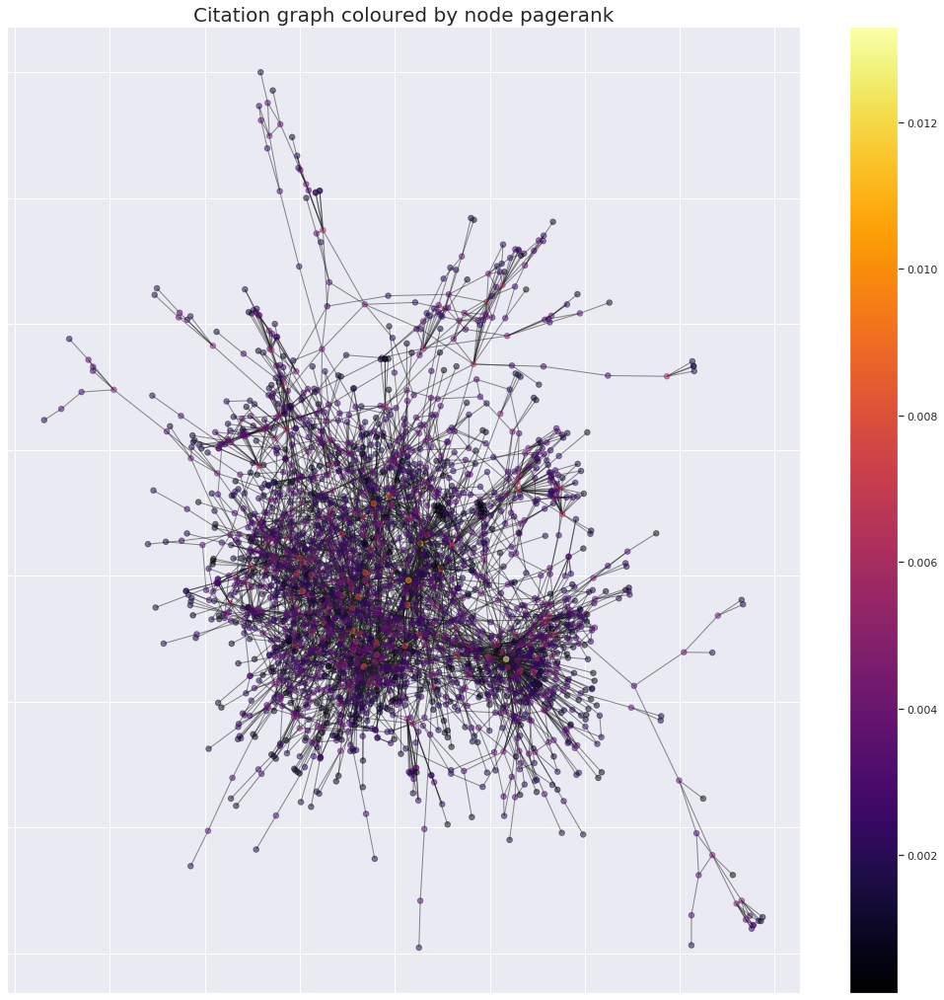

In [0]:
# Plot graph, colouring nodes by pagerank
pos=nx.spring_layout(g1)
colors=[x**0.1 for i,x in pagerank.items()]
cmap=plt.cm.inferno
vmin = min(colors)
vmax = max(colors)
fig, ax = plt.subplots(figsize=(18,18))
nx.draw_networkx(g1, ax=ax, pos=pos, node_color=colors, cmap=cmap,
           node_size=30, with_labels=False, alpha=0.5, vmin=vmin, vmax=vmax)
# Make colourbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin = vmin**10, vmax=vmax**10))
sm._A = []
plt.colorbar(sm)
plt.title('Citation graph coloured by node pagerank', fontsize=20)
plt.show()

- As is shown below, the pagerank scores and very similar to the degree scores, and therefore so is the resulting graph plotted. Nodes which are visited often from a random walk score highly as represented in the graph.

### Correlations between centrality measures

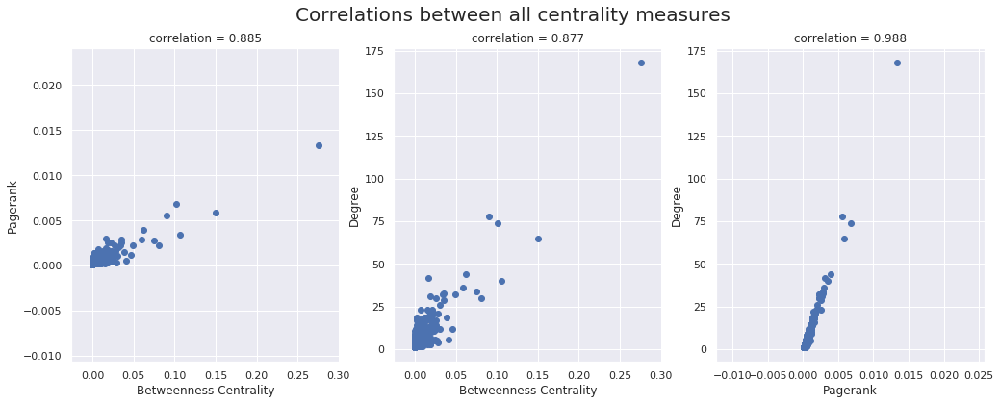

In [0]:
# Plot correlations between all centrality measures
fig, axes = plt.subplots(1, 3, figsize=(17, 6))

axes[0].scatter([x[1] for x in nsorted_bet_cen], [x[1] for x in nsorted_pagerank])
axes[0].set_title(f'correlation = {round(np.corrcoef([x[1] for x in nsorted_bet_cen], [x[1] for x in nsorted_pagerank])[0][1], 3)}')
axes[0].set_xlabel('Betweenness Centrality')
axes[0].set_ylabel('Pagerank')

axes[1].scatter([x[1] for x in nsorted_bet_cen], [x[1] for x in degree])
axes[1].set_title(f'correlation = {round(np.corrcoef([x[1] for x in nsorted_bet_cen], [x[1] for x in degree])[0][1], 3)}')
axes[1].set_xlabel('Betweenness Centrality')
axes[1].set_ylabel('Degree')

axes[2].scatter([x[1] for x in nsorted_pagerank], [x[1] for x in degree])
axes[2].set_title(f'correlation = {round(np.corrcoef([x[1] for x in nsorted_pagerank], [x[1] for x in degree])[0][1], 3)}')
axes[2].set_xlabel('Pagerank')
axes[2].set_ylabel('Degree')

fig.suptitle('Correlations between all centrality measures', fontsize=20)
plt.show()

- A high betweeness centrality means that the node connects many nodes together. **These nodes are often BETWEEN groups, not within groups, which differ from the other measures of centrality.**

- This explains the lower correlation for betweenness centrality with the other mesures (compared to the very high correlation for pagerank and degree, which are expected to be highly correlated).

- Since pagerank and degree are highly correlated, it is likely that, for example, websites that want to be ranked highly (by a simple pagerank algorithm) should aim to connect to as many other websites as possible, as would be expected. 

- A paper with a high pagerank means that that paper is very important, not only because it is cited many times (high degree) but also because it is likely that other important papers cite it, which is reflected in the high pagerank score, since a random walk is likely to visit this paper from other highly visited papers.

- The nodes which are highly central according to each of the measures is now displayed as a table:


In [0]:
a = [int(x[0]) for x in sorted_degree[:30]]
b = [int(x[0]) for x in sorted_bet_cen[:30]]
c = [int(x[0]) for x in sorted_pagerank[:30]]

df_table = pd.DataFrame(np.zeros((30, 3)), columns=['Degree', 'Bet-Cen', 'Pagerank'])
df_table.loc[:30, 'Degree'] = pd.Series(a)
df_table.loc[:30, 'Bet-Cen'] = pd.Series(b)
df_table.loc[:30, 'Pagerank'] = pd.Series(c)
print('-------------------------------------------')
print('-------------------------------------------')
print('Nodes that have top 30 scores for all 3 centrality measures:')
print(list(set(a) & set(b) & set(c)))
print('-------------------------------------------')
print('-------------------------------------------')
print('Top 30 nodes for each measure:')
print('-------------------------------------------')
df_table.astype(int)

-------------------------------------------
-------------------------------------------
Nodes that have top 30 scores for all 3 centrality measures:
[1122, 1894, 542, 1672, 1034, 1418, 78, 271, 977, 1905, 882, 1846, 666, 1563, 1245, 926, 95]
-------------------------------------------
-------------------------------------------
Top 30 nodes for each measure:
-------------------------------------------


,Degree,Bet-Cen,Pagerank
0,1245,1245,1245
1,271,1846,1563
2,1563,1894,1846
3,1846,1563,271
4,1672,271,1672
5,1491,977,1894
6,1894,926,1491
7,78,1672,78
8,926,78,542
9,542,95,926


### Central Nodes
- A reduced graph showing only the highly central nodes according to the three centrality measures are now drawn:

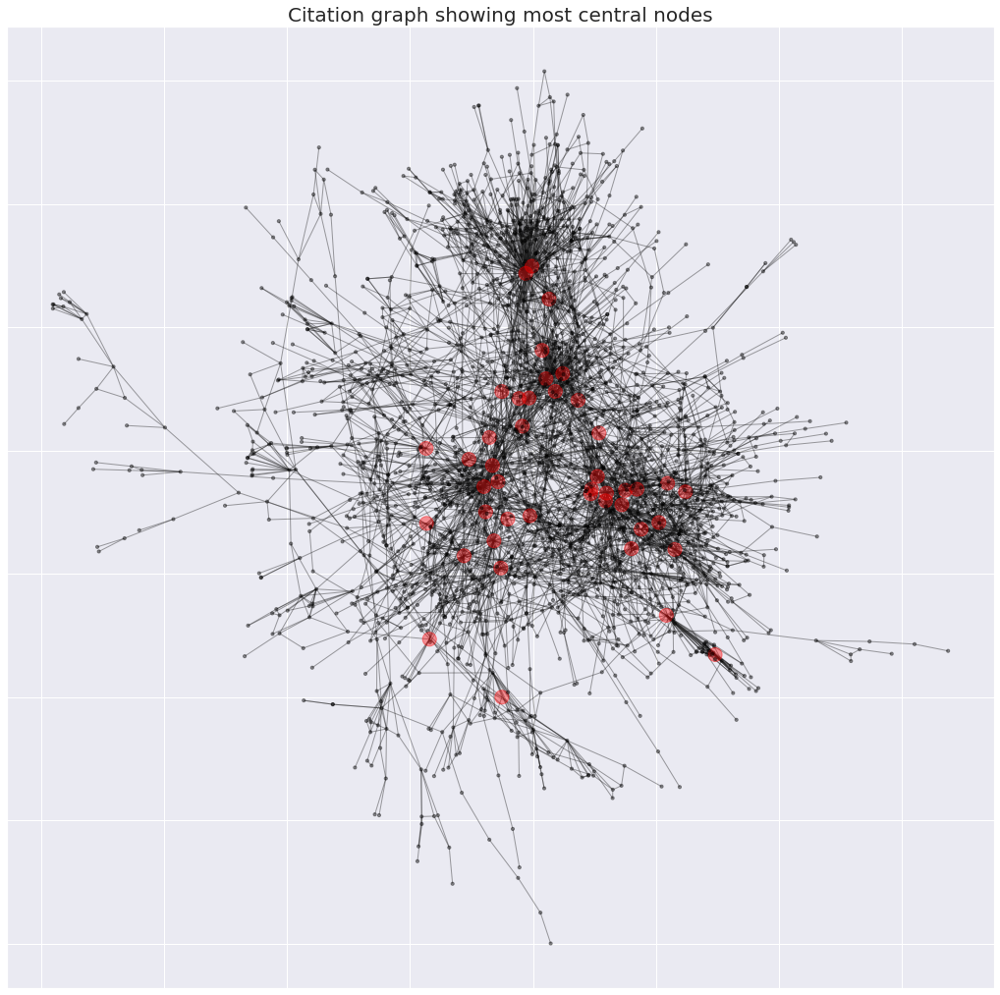

In [0]:
central_nodes = list(set(a) | set(b) | set(c))
# Function to calculate node size depending on centrality
def get_size(node, central_nodes):
    if node in central_nodes:
        return 200
    else:
        return 10

def get_color(node, central_nodes):
    if node in central_nodes:
        return 'red'
    else:
        return 'black'

# Plot the graph showing most central nodes
# Fix layout for consistency
pos=nx.spring_layout(g1)
cmap=plt.cm.inferno
vmin = min(colors)
vmax = max(colors)
nodelist = g1.nodes()
node_size = [get_size(x, central_nodes) for x in nodelist]
node_color = [get_color(x, central_nodes) for x in nodelist]
fig, ax = plt.subplots(figsize=(18,18))
nx.draw_networkx(g1, ax=ax, pos=pos, cmap=cmap, nodelist=nodelist, node_color=node_color,
           node_size=node_size, with_labels=False, alpha=0.4, vmin=vmin, vmax=vmax)

plt.title('Citation graph showing most central nodes', fontsize=20)
plt.show()

- These most central nodes according to the three measures are likely important papers that many other papers have cited (or less likely, that the paper itself cited many other papers).

## 1.3 Community detection on the citation graph
---
- The Clauset-Newman-Moore greedy modularity maximisation algorithm will be used to both choose the optimal number of clusters and the corresponding clustering of the feature matrix.

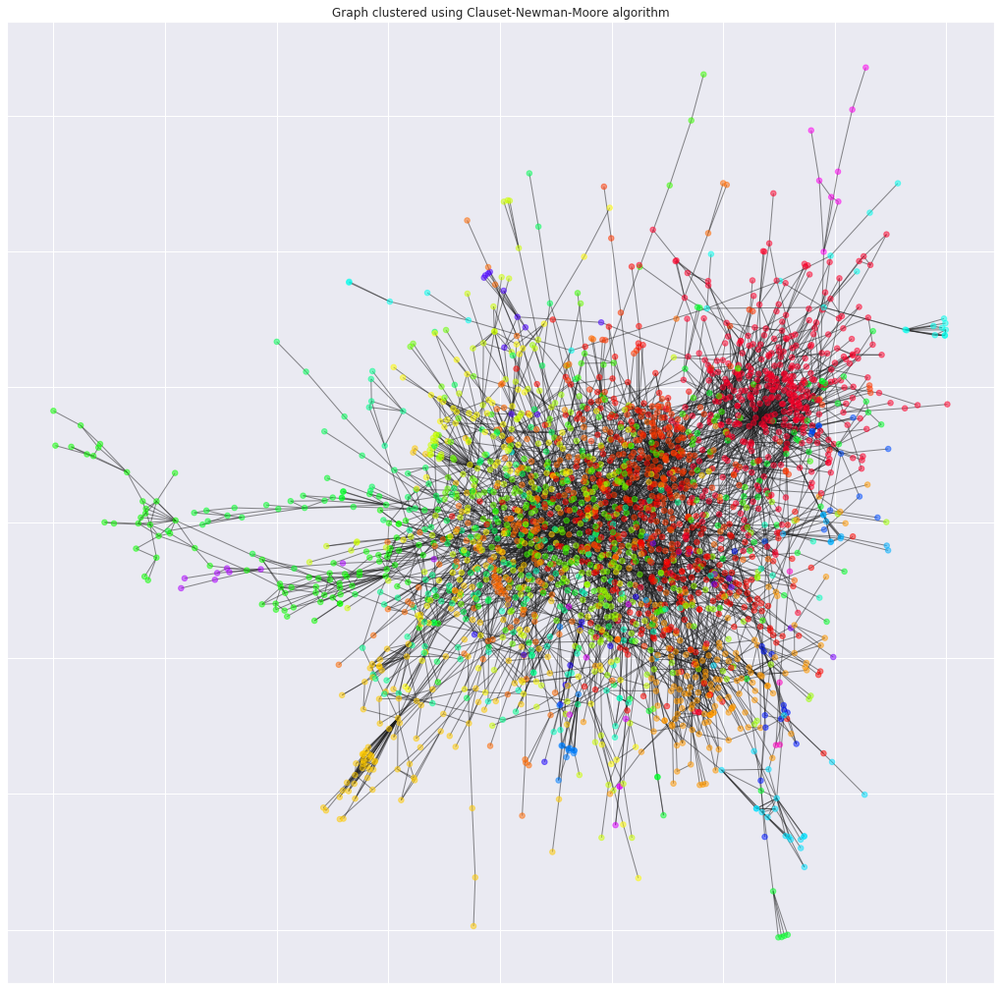

k* = 29


In [0]:
CNM_cluster = [list(x) for x in CNM(g1)]

# Construct dictionary assinging nodes to cluster
# CNM_cluster_dict = {}
CNM_labels = np.zeros(len(adj_mat[0]), dtype=int)
for i, x in enumerate(CNM_cluster):
    # CNM_cluster_dict.update(dict.fromkeys(x, i))
    for y in x:
        CNM_labels[y] = i

fig, ax = plt.subplots(figsize=(18,18))
nx.draw_networkx(g1, ax=ax, node_color=CNM_labels, node_size=20, with_labels=False, alpha=0.8, cmap='gist_rainbow')
plt.title('Graph clustered using Clauset-Newman-Moore algorithm')
plt.show()

k_star = len(set(CNM_labels))
print('k* = ' + str(k_star))

- The network nicely displays the clusterings given by the CNM algorithm using different colours. The distinct clusters can be easily seen at the extremeties of the graph.

### Distribution of Central Nodes
The distribution of central nodes across the k* communities will now be analyzed.
- First the frequnecy of the top 30 central nodes by degree and pagerank are visualised across communities:

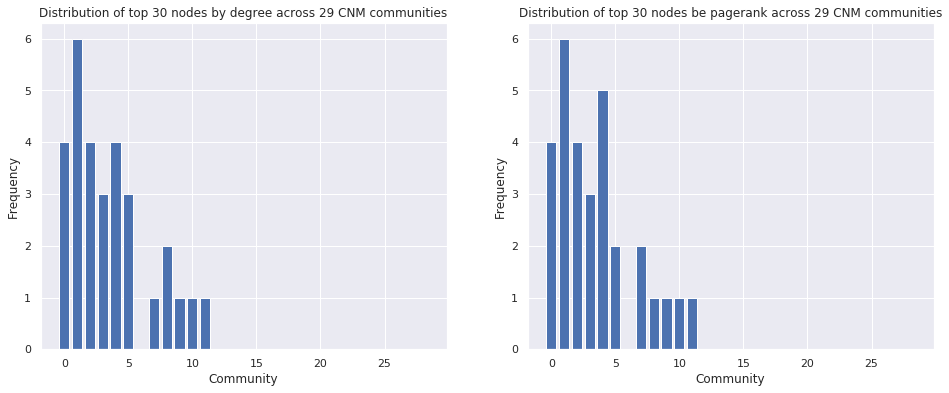

In [0]:
# Calculate frequency of central nodes across communities
a_dist = np.zeros(k_star)
c_dist = np.zeros(k_star)
for node in a:
    a_dist[CNM_labels[node]] += 1
for node in c:
    c_dist[CNM_labels[node]] += 1

# Plot frequency distributions across communities
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].bar(range(k_star), a_dist)
axes[0].set_xlabel('Community')
axes[0].set_ylabel('Frequency')
axes[0].set_title(f'Distribution of top 30 nodes by degree across {k_star} CNM communities')

axes[1].bar(range(k_star), c_dist)
axes[1].set_xlabel('Community')
axes[1].set_ylabel('Frequency')
axes[1].set_title(f'Distribution of top 30 nodes be pagerank across {k_star} CNM communities')

plt.show()

- The the Clauset-Newman-Moore greedy modu-
larity maximisation algorithm (CNM) works by greedily searching which communities to join that maximises modularity at each step. 

- Networks with high modularity have many connections between nodes within the same community, but few connections between nodes in different communities.

- From the frequency plots, we can see that all the highly central nodes according to degree and pagerank are distributed in the first communities, increasing in frequency as the community label decreases.

- This can be explained by the greedy CNM algorithm: the algorithm is likely to join communities with closeby central nodes, since these communities are likely to have many connections between them, whilst not necessarily having many connections to other communities. 

- Now the central nodes are visualised on the graph itself:


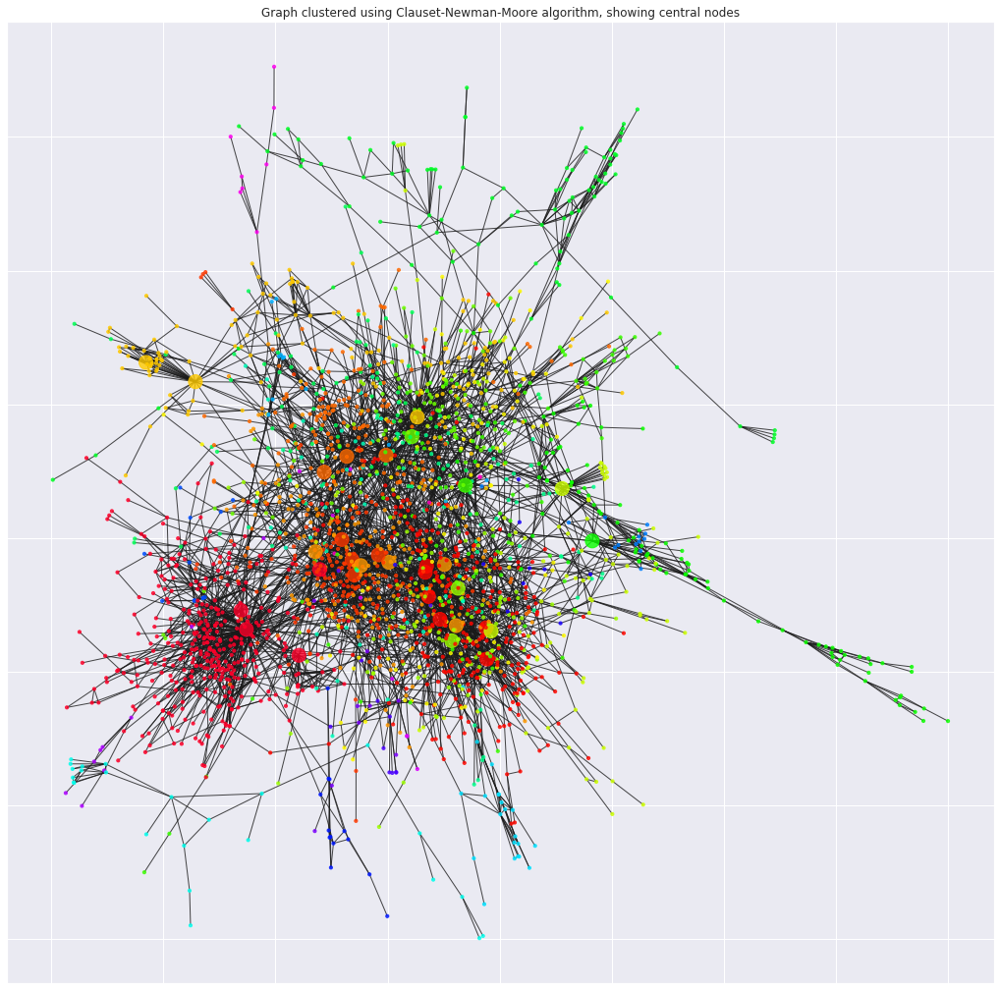

In [0]:
# Plot graph showing bigger central nodes
node_size = [get_size(x, list(set(a) | set(c))) for x in g1.nodes()]
fig, ax = plt.subplots(figsize=(18,18))
nx.draw_networkx(g1, ax=ax, node_color=CNM_labels, node_size=node_size, with_labels=False, alpha=0.8, cmap='gist_rainbow')
plt.title('Graph clustered using Clauset-Newman-Moore algorithm, showing central nodes')
plt.show()

- From the graph, it can be seen that there are some highly central and dense communities containing many central nodes and connections, constrasted with sparse communities that have little to no central nodes, often displayed at the extremeties of the graph.

- This again is a reflection of the CNM algorithm, and better expresses how it creates unbalanced communities in terms of density and centrality of nodes.

## 1.4 Comparing feature and graph clusterings
---
The ARI and AMI scores are computed to compare the k-means and the CNM clusterings.

- The ARI score represents how far away the clustering is from a purely random assignment.
- The AMI score evaluates the information contained in one clustering from the other.

- Note that the clusterings that are being compared are for two different datasets, so that there may be two documents that are very close to eachother in content, but do not cite eachother. This is likely to lead to different clusterings regardless of the method of clustering from the start.



In [0]:
AMI = adjusted_mutual_info_score(CNM_labels, kmeans.labels_)
ARI = adjusted_rand_score(CNM_labels, kmeans.labels_)

print(AMI)
print(ARI)

0.15315991285605193
0.06733446498800282


- The AMI and ARI scores can be used both to evaluate clustering quality and to evaulate similarities between different clusterings.
- The low ARI score suggests the two clusterings are not very similar to eachother, since a value close to 0 indicates a random labeling of the clusters.

- Similarly the low AMI score suggests that the samples are split among very different clusters.

- The two clusterings are now plot on graphs:


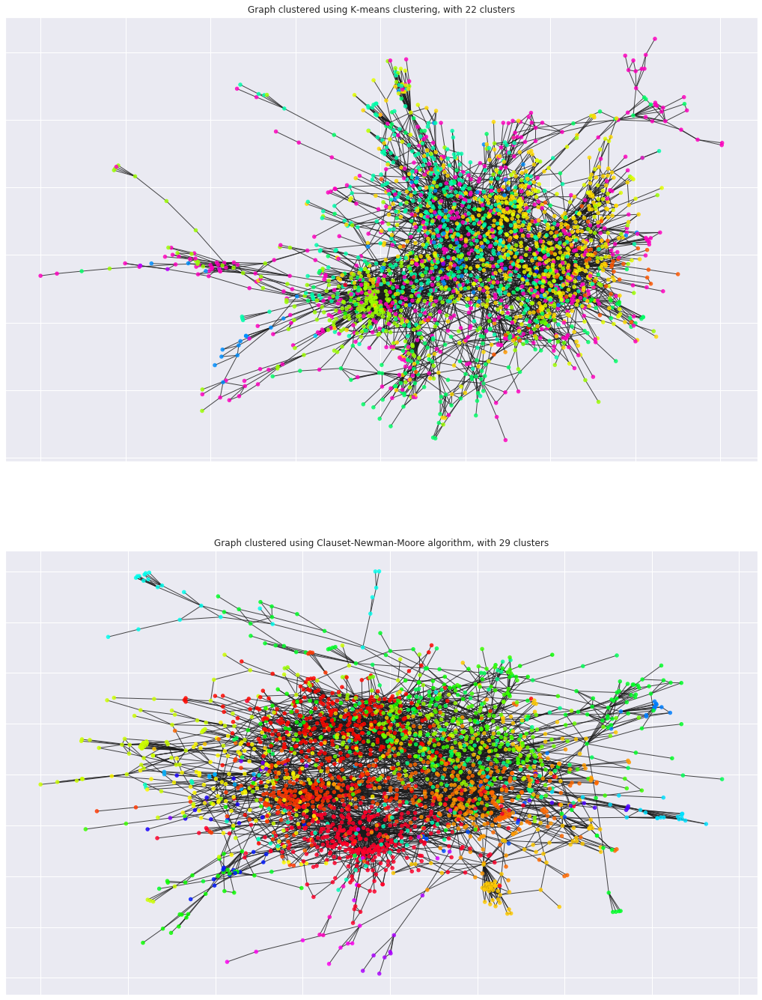

In [0]:
# Fit the kmeans algorithm
kmeans = KMeans(n_clusters=k_optimal, init='k-means++', n_init=1, random_state=42)
kmeans.fit(X)

pos=nx.spring_layout(g1)

# Plot graph with two different clusterings
fig, axes = plt.subplots(2, 1, figsize=(18,24))
nx.draw_networkx(g1, ax=axes[0], node_color=kmeans.labels_, node_size=20, with_labels=False, alpha=0.8, cmap='gist_rainbow')
axes[0].set_title(f'Graph clustered using K-means clustering, with {k_optimal} clusters')

nx.draw_networkx(g1, ax=axes[1], node_color=CNM_labels, node_size=20, with_labels=False, alpha=0.8, cmap='gist_rainbow')
axes[1].set_title(f'Graph clustered using Clauset-Newman-Moore algorithm, with {k_star} clusters')
plt.show()

- The clustering from k-means looks less clustered than the CNM clustering in this layout. This suggests that maybe the CNM clustering is a better choice in this scenario. The K-means clusters seem to yield strange results, where some sparsely connected nodes at the extremeties of the graph are not in the same cluster when it looks like they should be.
- Note that the k-means also has fewer clusters than with the CNM clustering.

- A heatmap between the two clusterings is now plotted in order to visualise the similiarities/differences in a different way:

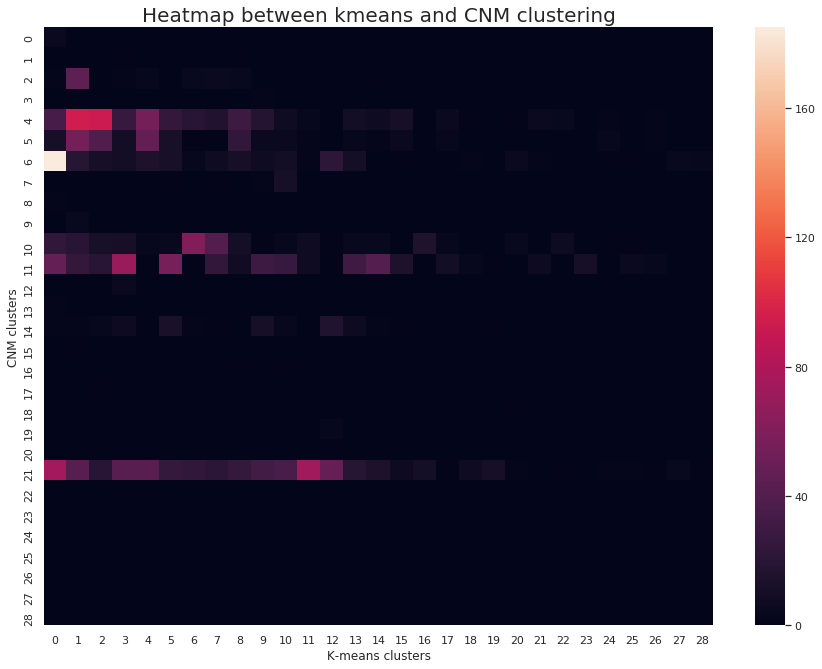

In [128]:
fig = plt.figure(figsize=(15,11))
sns.heatmap(confusion_matrix(kmeans.labels_, CNM_labels))
plt.title('Heatmap between kmeans and CNM clustering', fontsize=20)
plt.xlabel('K-means clusters')
plt.ylabel('CNM clusters')
plt.show()

- Again, this heatmap does not show at all a strong correspondance between the clusters. If there were, we would expect hot points for each row and column, but there is little evidence of this in theis heatmap. 
- However the 0th kmeans cluster and the 6th CNM cluster seem to be very similar.

---
---
# Task 2: Classification of a set of images
---
---

## Introduction
---
The next task will focus on the classification and clustering of 28x28 greyscale images of fashion items using various techniques for supervised and unsupervised learning.

## Data Preparation

The data is split up into a training and test set. Some of the images are also displayed so we know what kind of images we are dealing with.

- BALANCE THIS SPLIT?! + RANDOM SAMPLE IT?

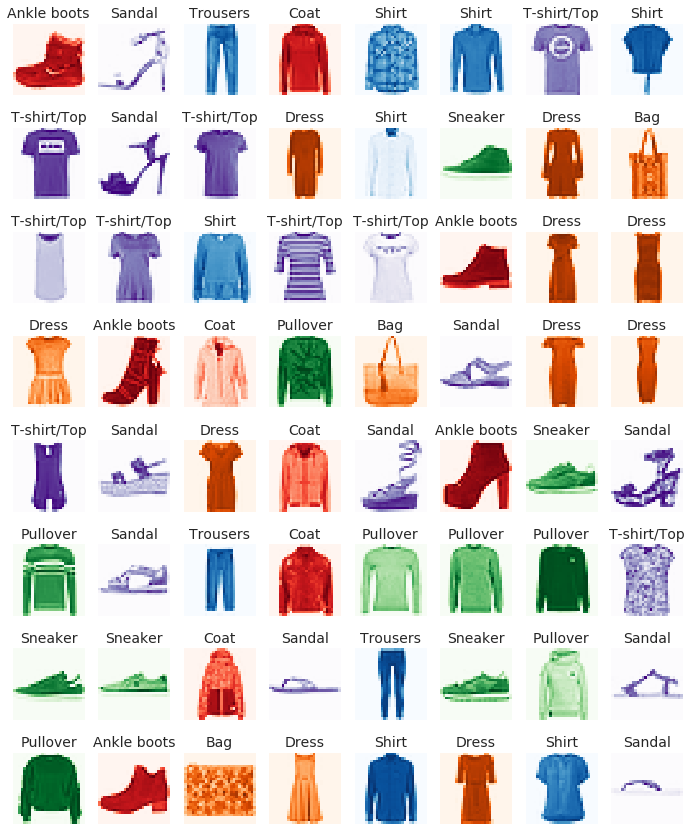

In [83]:
# Load in the fashion dataset from sklearn
mnist = fetch_openml('Fashion-MNIST', cache=False)
X = mnist.data.astype('float32')
y = mnist.target.astype('int64')

# Split into training and test sets using stratified random sampling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1/7, random_state=42)

# Create mapping of labels
fashion_map = ['T-shirt/Top', 'Trousers', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boots']
fashion_colors = ['Purples', 'Blues', 'Greens', 'Oranges', 'Reds'] * 2

# Display some labelled images in the dataset
dim = 8
fig, axes = plt.subplots(dim, dim, figsize=(12,15))

for i in range(dim):
    for j in range(dim):
        axes[i, j].imshow(X[j*dim+i].reshape(28, 28) , cmap=fashion_colors[y[j*dim+i]])
        axes[i, j].set_title(fashion_map[y[j*dim+i]], fontsize=14)
        axes[i, j].axis('off')
plt.show()

## Scale/Orientation of Data
- The displayed images are in 5 colours just to make them stand out more, but in the data they are just greyscale images. Also, note that all clothing items are of the same orientation, including all the shoes which point to the left. This makes it easier for a classifier to classify these images, but will probably not work well for data with different orientations. 

- If we wanted to train a classifier that could recognize the clothing items irrespective of their orientation/scale, we could rescale/mirror/rotate the original data in order to create a much bigger dataset with all the augmented images included. The hope then is that the model would be able to reognize items of clothing irrepective of their orientation/scale. We might however expect this model's accuracy to be loewr since this is a harder task.

## 2.1 Unsupervised clustering of the image dataset
---

The following introduction to clustering and k-means is from part 1, and is included for completeness.

- The aim of unsupervised clustering of data is to find groups that partition the samples, such that points in a group are more similar to eachother than points from different groups.
- More formally, let N be the number of sample and K the number of clusters. The aim is to minimize
$$ Trace \Big[ (H^TH)^{-1} [H^TDH] \Big]
$$
where H is the NxK assigment matrix mapping each sample to one of k clusters, and D is the NxN distance (or measure of 'closeness') matrix between all the samples. The elements on the diagonals of the KxK matrix $[H^TDH]$ correspond to the sums of the distances between all points within the same cluster, so that the sum of these distances is minimized. $(H^TH)^{-1}$ is used to normalize the diagonals of the matrix $[H^TDH]$ using the sizes of the groups.


### K-means Algorithm
- Complete enumeration in order to find this global minimum is not computationally feasible for any sufficiently large dataset.
- The K-means algorithm uses a heuristic to reduce the computational cost of finding a solution (but not necessarily the global solution) to this problem.
- The algorithm starts by randomly assinging each sample to one of the k clusters. At each iteration until convergence, each sample is reassigned to the cluster whose centroid is closest to the sample.
- The algorithm will terminate when some condition is met, such as when the clustering doesn't change between iterations or after a set number of iterations is reached.


### Measures of 'closeness' between samples
- There needs to be decisions made about how to define '**closeness**' between points, and **how many groups** to split samples into.
- Measures of similarity/dissimilarity to consider:
    - Euclidean
    - Manhattan Distance
    - Cosine similarity (measure of vector alignment)
    - Correlation

- The **euclidean distance** will be used in this example, although the other distances could be considered. The sklearn implementation of K-Means uses the Euclidean distance so it is also convenient to use.

- In this example, the samples are 784 dimensional vectors.

### Choosing the number of clusters, k
- A range of values for k will be tested. The aim is to find the value of k for which the clustering is optimal by some metric/metrics.

- As discussed in the 'Randomness in K-Means Clustering' section, n_init would ideally be set to something like 10, so that the K-means algorithm runs this many times and the best model is chosen (in terms of inertia). However computing time is very large so I have chosen to set n_init to 1. 

In [11]:
# Setup list of numbers of clusters and metrics
k_values = np.linspace(2, 30, 6, dtype=int)
CH = []
DB = []
sil = []

for k in k_values:
    if verbose: print(f'Running k-means for k={k}')
    # Use K-means algorithm to cluster papers with k clusters
    kmeans = KMeans(n_clusters=k, n_init=1, random_state=42)
    kmeans.fit(X_train)

    # Store Calinski-Harabasz score
    CH.append(CH_score(X_train, kmeans.labels_))
    # Store Davies-Bouldin Score
    DB.append(DB_score(X_train, kmeans.labels_))
    # Store silhouette score
    sil.append(silhouette_score(X_train, kmeans.labels_))

Running k-means for k=2
Running k-means for k=7
Running k-means for k=13
Running k-means for k=18
Running k-means for k=24
Running k-means for k=30


#### Calinski-Harabasz Score
- The Calinski-Harabasz score takes into account the dispersion within clusters and dispersion between clusters, so that tight clusters that are far away from eachother score well. 
- A higher score is better - more will be said about this score later.

#### Davies-Bouldin Score
- The Davies-Bouldin score is similar to the Calinski-Harabasz score except it tends to score clusters equally-distanced from eachother highly, in comparison to clusters of approximately the same size as in the Calinsky-Harabasz. A lower score is better.


#### Inertia
- Inertia is the cost function that k-means uses, ie. the sum of squared distances of all samples from their closest cluster centroid.

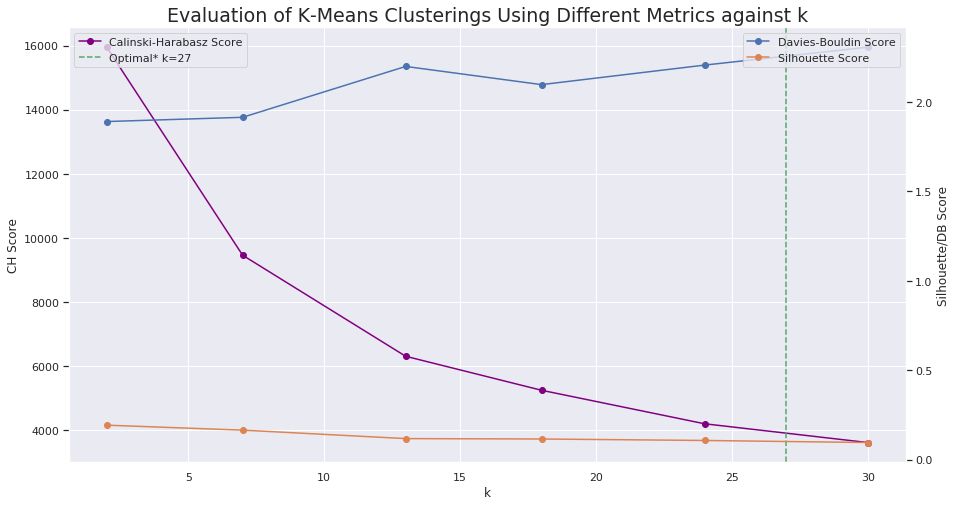

In [16]:
# Plot scores against k
fig, ax1 = plt.subplots(1, 1, figsize=(15,8))
ax2 = ax1.twinx()

# Plot graphs against values of k
ax1.plot(k_values, CH, marker='o', color='purple', label='Calinski-Harabasz Score')
ax2.plot(k_values, DB, marker='o', label='Davies-Bouldin Score')
ax2.plot(k_values, sil, marker='o', label='Silhouette Score')
ax1.set_title(f'Evaluation of K-Means Clusterings Using Different Metrics against k', fontsize=19)

# Plot vertical line for optimal k value
ax1.axvline(x=k_optimal, linestyle='dashed', color='g', label=f'Optimal* k={k_optimal}')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

ax1.set_xlabel('k')
ax1.set_ylabel('CH Score')
ax2.set_ylabel('Silhouette/DB Score')
ax2.grid(False)

plt.show()

- The DB score rises slightly as k increases, with a maximum value reached somewhere around k = 10 to 14. This could be some evidence in favour of the correct number of clusterings for this dataset, 10.

- The other scores don't give much away in terms of finding an optimal k value. The silhouette score remains around 0, and is discussed in the next section in more detail.

### Silhouette Coefficient
- The Silhouette coefficient is bounded between -1 and 1, with a higher score indicating a better clustering with dense and well-separated clusters. It uses the distance between samples and other points in the same cluster, as well as the distance between samples and other points in the next nearest cluster.

- The silhouette plot shows how close each point in each cluster to points in nearby clusters. It provide a way to visualize the quality of clusters. The aim is to find a clustering that provides clusters with similar and high silhouette scores. For this we can use the silhouette score, which is the average silhouette coefiicient across all k clusters.

Text(0.5, 0.98, 'Silhouette Plots for varying k')

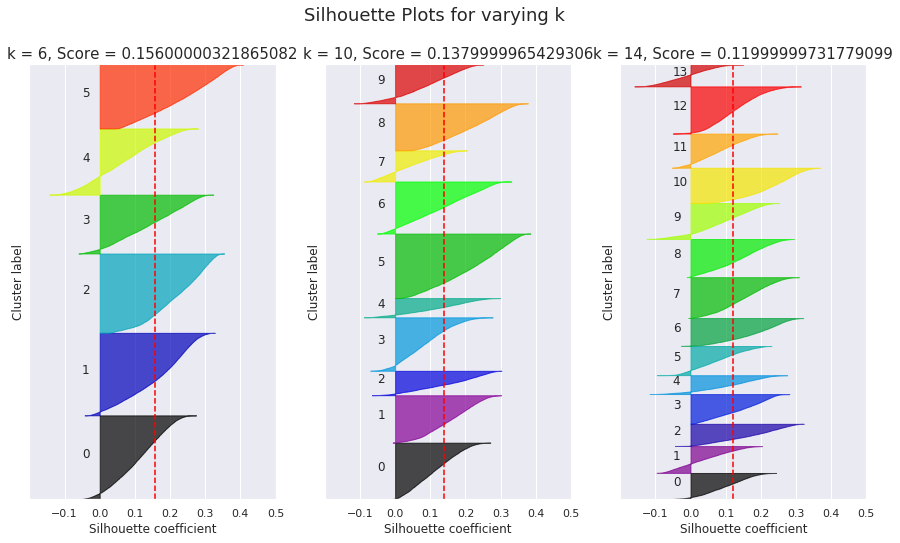

In [17]:
k_plot_list = [6, 10, 14]
fig, axes = plt.subplots(1, len(k_plot_list), figsize=(15,8))

for j, k in enumerate(k_plot_list):
    if verbose print(k)
    # Initialize the silhouette plot
    axes[j].set_xlim([-0.2, 0.5])
    axes[j].set_ylim([0, len(X_train) + (k + 1) * 10])

    # Cluster using k-means with
    kmeans = KMeans(n_clusters=k, n_init=1, random_state=42)
    kmeans.fit(X_train)
    cluster_labels = kmeans.predict(X_train)

    # Compute average silhouette score
    silhouette_avg = silhouette_score(X_train, cluster_labels)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_train, cluster_labels)

    y_lower = 10
    for i in range(k):
        # Aggregate the silhouette scores
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / k)
        axes[j].fill_betweenx(np.arange(y_lower, y_upper),
                            0, ith_cluster_silhouette_values,
                            facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        axes[j].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    axes[j].set_title(f"k = {k}, Score = {round(silhouette_avg, 3)}", fontsize=15)
    axes[j].set_xlabel("Silhouette coefficient")
    axes[j].set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    axes[j].axvline(x=silhouette_avg, color="red", linestyle="--")
    
    axes[j].set_yticks([])  # Clear the yaxis labels / ticks
    axes[j].set_xticks([-0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5])

fig.suptitle('Silhouette Plots for varying k', fontsize=18)

- For k=10 the silhouette plot show reasonably well-balanced sizes of clusters, with not too much overlap.  k=14 shows some small classes, with more overlapping than in k=10. k=6 has a cluster that has a very low silhouette score. 
- As a result, and from the silhouette plots, there is some reason to say that k=10 is roughly optimal for this dataset.

### Randomness in K-means clustering
- As mentioned before, the K-means is not likely to converge to the global minimum, and so it will likely converge to just a local minimum. The algorithm is sensitive to the initial random clustering of the points, and will likely yield different results each time it is run.

- **In order to account for this, the algorithm can be run many times, and the best clustering is then chosen. This is acheived using the n_init parameter in sklearn's K-Means implementation. In this case, I set n_init to 10.**

- If the outcomes are similar, it could be an indication that your outcomes are 'good', whereas if there is a lot of variance in the outcomes, it could indicate that k-means might not be the best algorithm with which to cluster this datset.

- 'k-means++' can also be used, which chooses the initial clustering in a better way. This is likely to decrease the variance of the models for different random seeds. Note that this alteration is used by default by sklearn.

#### Distribution of Cluster Sizes

10
remove
[7817. 6545. 3366. 7385. 2651. 8904. 7191. 4292. 6492. 5357.]


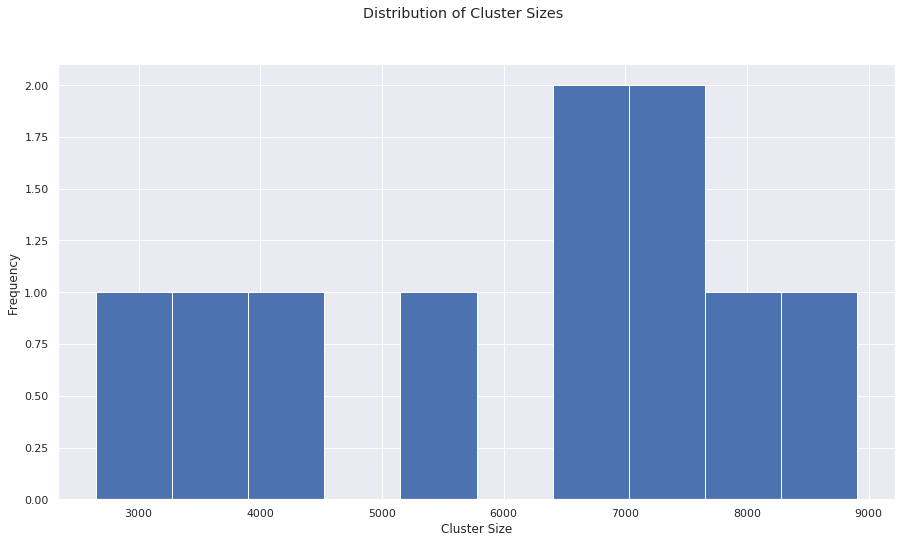

In [18]:
# Train model for k=10
k_optimal = 10
print(k_optimal)
kmeans = KMeans(n_clusters=k_optimal, init='k-means++', n_init=1, random_state=42)
kmeans.fit(X_train)

# Plot cluster size distribution
cluster_sizes = np.zeros(k_optimal)
cluster_labels = kmeans.predict(X_train)
for i in range(k_optimal):
    cluster_sizes[i] = int(cluster_labels[cluster_labels == i].shape[0])

fig, ax = plt.subplots(figsize=(15,8))
ax.hist(cluster_sizes)
fig.suptitle('Distribution of Cluster Sizes')
ax.set_xlabel('Cluster Size')
ax.set_ylabel('Frequency')
print(cluster_sizes)

- The clustering results in a modest range of cluster sizes, which makes sense with the given data. There are no outlying clusters with very small or big size, which could suggest this clustering for k=10 is reasonable for the data.

#### Within Groups / Across Group Similarity
- The within and across group dispersion is calcualted as in the Calinski-Harabasz score, which uses the mean of the clusters and of all the points for its calculations:

In [0]:
extra_disp, intra_disp = 0., 0.
mean = np.mean(X, axis=0)
for k in range(k_optimal):
    cluster_k = np.array(X_train[cluster_labels == k])
    cluster_k = cluster_k[0, :]
    mean_k = np.mean(cluster_k, axis=0)
    extra_disp += len(cluster_k) * np.sum((mean_k - mean) ** 2)
    intra_disp += np.sum((cluster_k - mean_k) ** 2)

### Final model metrics

In [20]:
# Populate table (training)
df_table = pd.DataFrame(columns=['', f'k_optimal={k_optimal}'])
df_table.loc[0] = ['CH Score', round(CH_score(X_train, kmeans.labels_), 3)]
df_table.loc[1] = ['DB Score', round(DB_score(X_train, kmeans.labels_), 3)]
df_table.loc[2] = ['Silhouette Score', round(silhouette_score(X_train, kmeans.labels_), 3)]
df_table.loc[3] = ['Within Group Dispersion', round(intra_disp, 1)]
df_table.loc[4] = ['Across Group Dispersion', round(extra_disp, 1)]
df_table

,,k_optimal=10
0,CH Score,7.538723e+03
1,DB Score,2.017000e+00
2,Silhouette Score,1.380000e-01
3,Within Group Dispersion,6.490045e+07
4,Across Group Dispersion,1.983541e+10


### Outlier Sensitivity 
- K-means senstive to outliers because of how centroids are calculated as the mean of all the samples in the respective cluster. This can be combatted using data exploration (this is hard with many dimensions), or extensions to kmeans.

- K-medoids can be used, which assigns one of the points within the cluster to be the 'center', choosing the point which is most representative of the cluster.

## Visualization of Centroids and Clustering

The k-means clustering can be visualsed using PCA. 

- The samples and centroids will be reduced to two dimensions using the PCA tranform fit on the samples.

- In this first implementation, a kmeans clustering is fit onto the **PCA reduced data** in two dimensions. 

- Only 10000 points are plotted so that the figure isn't too cluttered.

- The centroids are mapped onto the correct labels by using the majority label from the predicted labels of that cluster for the centroid.

In [58]:
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

fashion_kmeans_labels = np.zeros(10, dtype=int)

# Scale data
Xscaler = sklearn.preprocessing.StandardScaler()
Xscaler.fit(X_train)
data = Xscaler.transform(X_train)

n_samples, n_features = data.shape
n_labels = len(np.unique(y_train))
labels = y_train

# Use PCA on data in order to visualize
pca = PCA(n_components=2).fit(data)
print('PCA explained variance in first 2 dimensions:')
print(sum(pca.explained_variance_ratio_[:2]))

reduced_data = pca.transform(data)
kmeans = KMeans(n_clusters=10, n_init=1, random_state=42)

# Fit k-means on REDUCED data
kmeans.fit(reduced_data)

n = 60000

# Plot the centroids as images
def imscatter(x, y, image, ax=None, zoom=1):
    try:
        image = plt.imread(image)
    except TypeError:
        # Likely already an array...
        pass
    im = OffsetImage(image, zoom=zoom)
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0 in zip(x, y):
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

# Transform high-dimensional centroids into 2D from pca fit
centroids = kmeans.cluster_centers_
# centroids_reduced = pca.transform(Xscaler.transform(centroids))
centroids_reduced = centroids

# Save images
predictions = kmeans.predict(reduced_data)
for i, centroid in enumerate(centroids):
    # Draw centroid
    # plt.figure(frameon=False)
    matrix = centroid.copy()

    # Find what it represents by finding the majority label
    j = Counter(y_train[np.where(predictions==i)]).most_common()[0][0]

PCA explained variance in first 2 dimensions:
0.36443158984184265


The Variance described by the first two dimensions of the PCA transform is reasonably high, so that it is justifiable to fit a clustering on just these two dimensions.

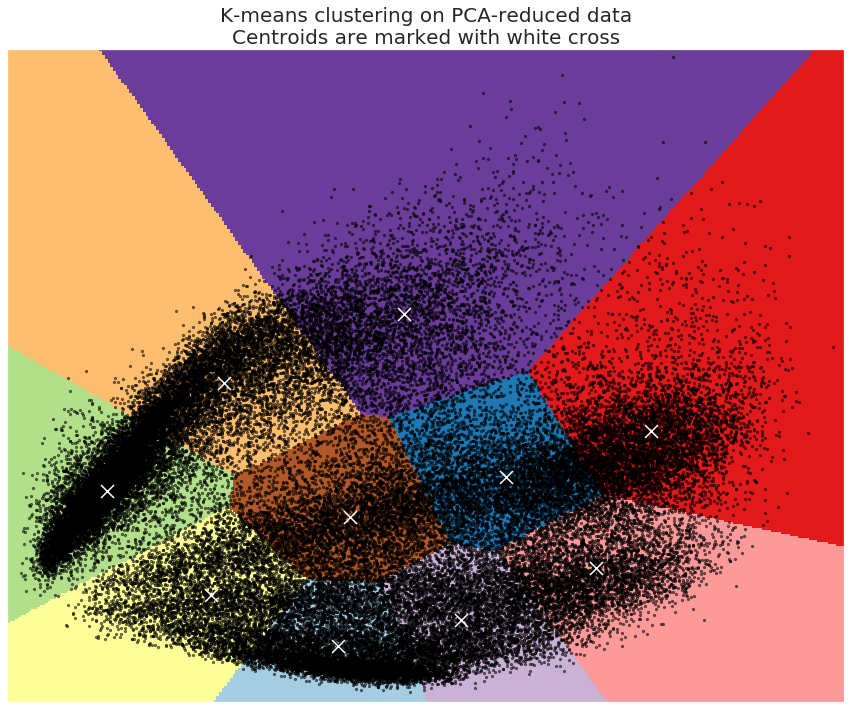

In [59]:
# Step size of the mesh
h = .2

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = reduced_data[:, 0].min() - 1, reduced_data[:, 0].max() + 1
y_min, y_max = reduced_data[:, 1].min() - 1, reduced_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
fig, ax = plt.subplots(figsize=(15,12))
plt.clf()
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired,
           aspect='auto', origin='lower')

color_map = [fashion_colors[i][:-1] for i in y_train[:n]]
plt.scatter(reduced_data[:n, 0], reduced_data[:n, 1], c='black', s=5, alpha=0.5)

# plot centroids
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='w', zorder=10)

plt.title('K-means clustering on PCA-reduced data\n'
          'Centroids are marked with white cross', fontsize=20)
# plt.xlim(x_min, x_max)
# plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
ax.set_facecolor('white')
plt.show()

- Now, a K-means clustering is fit to the **full** (non-reduced) data, and **PCA is used only to visualize the clustering**.

In [0]:
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

fashion_kmeans_labels = np.zeros(10, dtype=int)

# Scale data
Xscaler = sklearn.preprocessing.StandardScaler()
Xscaler.fit(X_train)
data = Xscaler.transform(X_train)

n_samples, n_features = data.shape
n_labels = len(np.unique(y_train))
labels = y_train

# Use PCA on data in order to visualize
pca = PCA(n_components=2).fit(data)

reduced_data = pca.transform(data)
kmeans = KMeans(n_clusters=10, n_init=1, random_state=42)

# Fit k-means on FULL data
kmeans.fit(X_train)

# Step size of the mesh
h = .2


n = 60000

# Plot the centroids as images
def imscatter(x, y, image, ax=None, zoom=1):
    try:
        image = plt.imread(image)
    except TypeError:
        # Likely already an array...
        pass
    im = OffsetImage(image, zoom=zoom)
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0 in zip(x, y):
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

# Transform high-dimensional centroids into 2D from pca fit
centroids = kmeans.cluster_centers_
centroids_reduced = pca.transform(Xscaler.transform(centroids))

# Save images
predictions = kmeans.predict(X_train)
for i, centroid in enumerate(centroids):
    # Draw centroid
    plt.figure(frameon=False)
    matrix = centroid.reshape(28, 28).copy()

    # Find what it represents by finding the majority label
    j = Counter(y_train[np.where(predictions==i)]).most_common()[0][0]
    print(j, fashion_colors[j])

    # Set white pixels to nan for transparency
    matrix[matrix == 0] = np.nan
    plt.imshow(matrix, cmap=fashion_colors[j])
    plt.axis('off')
    plt.savefig(str(j)+'.png', transparent=True)

    # Map to actual label
    fashion_kmeans_labels[i] = j

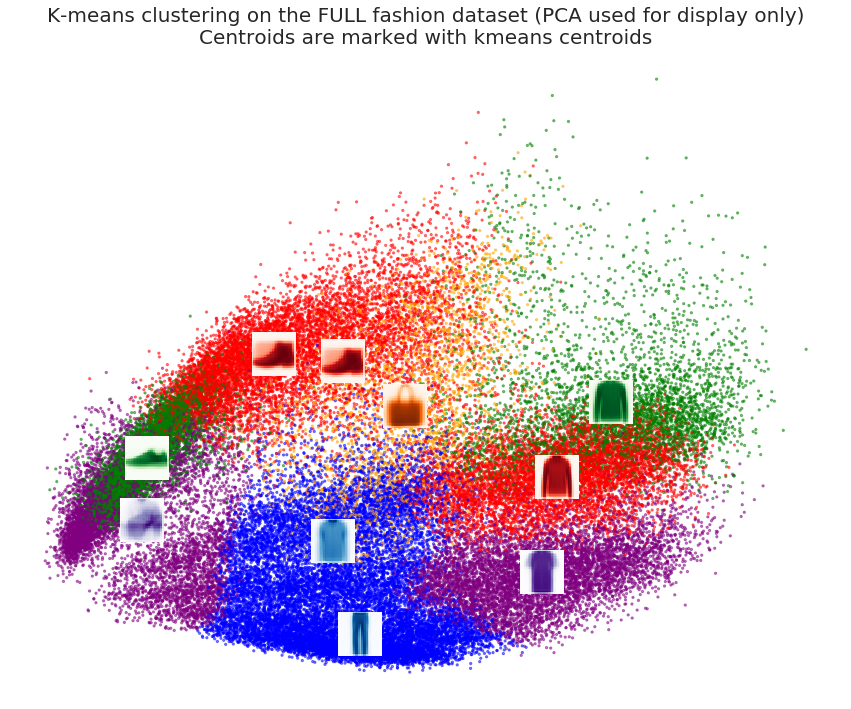

In [61]:
fig, ax = plt.subplots(figsize=(15,12))
color_map = [fashion_colors[fashion_kmeans_labels[i]][:-1] for i in kmeans.predict(X_train)]
plt.scatter(reduced_data[:n, 0], reduced_data[:n, 1], c=color_map, s=5, alpha=0.5) 

# plot centroids
for i, centroid in enumerate(centroids):
    j = Counter(y_train[np.where(predictions==i)]).most_common()[0][0]
    # Plot on graph
    image1 = plt.imread(str(j) + '.png')
    imscatter(centroids_reduced[i, 0], centroids_reduced[i, 1], image1, ax=ax, zoom=0.2)

# for i in range(10):
#     image1 = plt.imread(str(i) + '.png')
#     imscatter(centroids_reduced[i, 0], centroids_reduced[i, 1], image1, ax=ax, zoom=0.2)


# image1 = plt.imread('image1.png')
# imscatter(centroids[:, 0], centroids[:, 1], image1, ax=ax, zoom=0.3)
# my_labels = kmeans.predict(centroids)
#
# for i, txt in enumerate(my_labels):
#     plt.annotate(fashion_map[txt], (centroids[i, 0], centroids[i, 1]))

plt.title('K-means clustering on the FULL fashion dataset (PCA used for display only)\n'
          'Centroids are marked with kmeans centroids', fontsize=20)
# plt.xlim(x_min, x_max)
# plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
ax.set_facecolor('white')
plt.show()

- Using PCA, the high-dimensional clusters can be visualized. There is some nice separation of the clusters, especially for the easier-to-classify classes such as the Trousers, which are quite different from the other fashion items.

- Note the left facing shoes and general homogeneity of the orientation and scale of the images, which is reflected in the cetroids since they are quite well-defined and clear. For a less contrived data set with more 'messy' data, we would expect the centroids to be more blurry. 

- Data augmentation such as adding reflected/rotated/scaled images into the training data would probably be beneficial with other more 'messy' datasets, but is likely to be detrimental in this case since all the data is nicely scaled/oriented.

### Visualization of Centroids
- The real labels are assigned to each cluster by taking the majority prediction of each cluster.

0
1
2
3
4
5
6
7
8
9


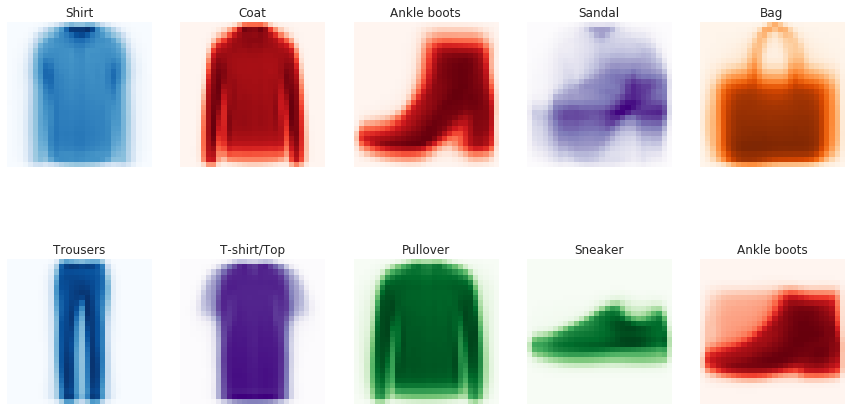

In [62]:
fig, axes = plt.subplots(2, 5, figsize=(15, 8))
for i in range(2):
    for j in range(5):
        matrix = centroids[5*i+j].reshape(28, 28).copy()
        k = Counter(y_train[np.where(predictions==5*i+j)]).most_common()[0][0]
        cmap = fashion_colors[k]
        axes[i, j].imshow(matrix, cmap=cmap)
        axes[i, j].axis('off')
        axes[i, j].set_title(fashion_map[k])
        print(5*i+j)

- Using this method, we get some overlapping/missing classes. This is natural considering the only supervision given to the model was to assign 10 clusters to the data.
- The resulting centroids and labels mostly bear a good resemblance to the actual 10 classes, which is impressive since this method is unsupervised.

## kNN
- The kNN classifier **uses the unsupervised kmeans clustering** in order to classify the data. 
- **An optimization of k was attempted but the computational time is very large. Ideally, I would have used K-Fold Cross Validation to maximise the average validation accuracy across folds by varying the value of k between, say, 1 and 20.**

In [63]:
neigh = KNeighborsClassifier(n_neighbors=5)
neigh.fit(X_train, [fashion_kmeans_labels[x] for x in predictions])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [64]:
# Calculate metrics
y_pred = neigh.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

# Populate metrics table
df_table = pd.DataFrame(columns=['Test Set Metrics', 'kNN Classifier'])
df_table.loc[0] = ['Accuracy', round(accuracy, 3)]
df_table.loc[1] = ['Precision', round(precision, 3)]
df_table.loc[2] = ['Recall', round(recall, 3)]
df_table.loc[3] = ['F1 Score', round(f1, 3)]
df_table

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Test Set Metrics,kNN Classifier
0,Accuracy,0.554
1,Precision,0.521
2,Recall,0.555
3,F1 Score,0.516


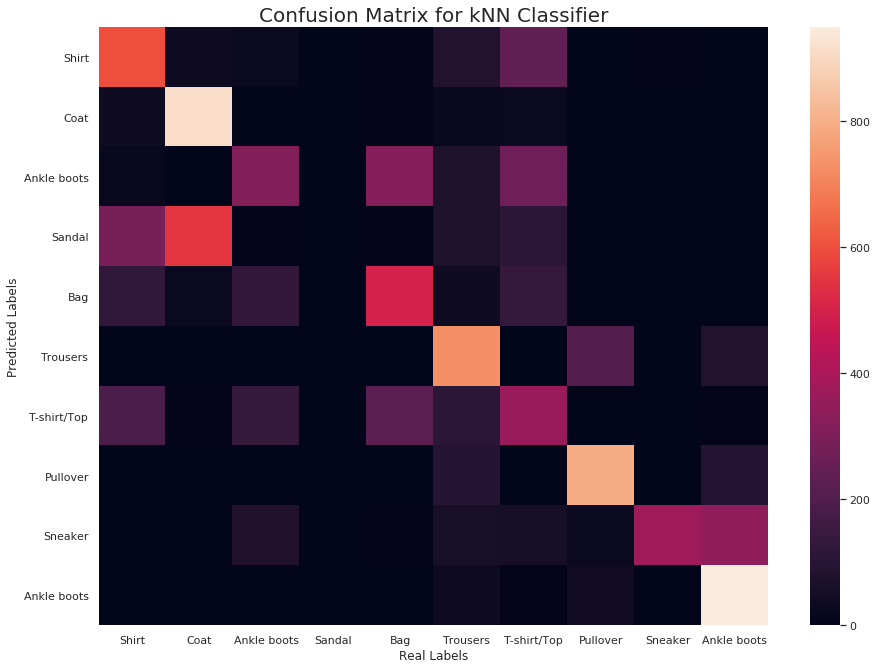

In [65]:
fig = plt.figure(figsize=(15,11))
labels = [fashion_map[int(x)] for x in fashion_kmeans_labels]
sns.heatmap(confusion_matrix(y_test, y_pred), xticklabels=labels, yticklabels=labels)
plt.title('Confusion Matrix for kNN Classifier', fontsize=20)
plt.xlabel('Real Labels')
plt.ylabel('Predicted Labels')
plt.show()

- The kNN classifiers achieves a reasonable accuracy score on the test set, predicting much better than average. This was expected after seeing the the kmeans classification also gave a reasonable but far from perfect clustering of the data.
- The classifier seems particularly good at classifying trousers / ankle boots because they distinctly different to the other items.

## Alternative Clustering Methods

### Hierachical Clustering
- Hierachical clustering aims to describe clustering of data as a binary tree (or a dendogram).
- Because of how the binary splits are generated, the outcome is hierachical, in that lower branches originating from one split are in the same cluster that corresponds to that split.
- An agglomerative scheme will be used, which goes from the bottom of the tree upwards. That is, starting from the N samples in N clusters, the number of clusters is reduced from N to 1.

In [10]:
# Setup list of numbers of clusters and metrics
k_values = np.linspace(2, 30, 8, dtype=int)
CH = []
DB = []
sil = []

for k in k_values:
    if verbose: print(f'Running hierachical clustering for k={k}')
    # Use algorithm to cluster clothing with k clusters
    model = AgglomerativeClustering(n_clusters=k)
    model = model.fit(X_train[:5000, :])

    # Store Calinski-Harabasz score
    CH.append(CH_score(X_train[:5000, :], model.labels_))
    # Store Davies-Bouldin Score
    DB.append(DB_score(X_train[:5000, :], model.labels_))
    # Store Silhouette Score
    sil.append(silhouette_score(X_train[:5000, :], model.labels_))

Running hierachical clustering for k=2
Running hierachical clustering for k=6
Running hierachical clustering for k=10
Running hierachical clustering for k=14
Running hierachical clustering for k=18
Running hierachical clustering for k=22
Running hierachical clustering for k=26
Running hierachical clustering for k=30


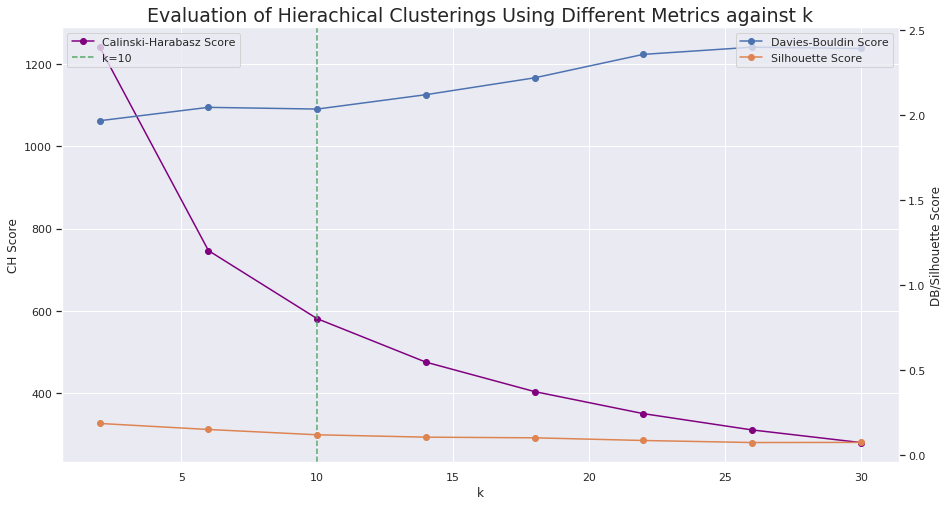

In [77]:
# Plot scores against k
fig, ax1 = plt.subplots(1, 1, figsize=(15,8))
ax2 = ax1.twinx()

# Plot graphs against values of k
ax1.plot(k_values, CH, marker='o', color='purple', label='Calinski-Harabasz Score')
ax2.plot(k_values, DB, marker='o', label='Davies-Bouldin Score')
ax2.plot(k_values, sil, marker='o', label='Silhouette Score')
ax1.set_title(f'Evaluation of Hierachical Clusterings Using Different Metrics against k', fontsize=19)

# Plot vertical line for optimal k value
ax1.axvline(x=10, linestyle='dashed', color='g', label=f'k=10')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

ax1.set_xlabel('k')
ax1.set_ylabel('CH Score')
ax2.set_ylabel('DB/Silhouette Score')
ax2.grid(False)

plt.show()

- As before, the CH and Silhouette scores are not very informative here of an optimal value for k. However for the DB score, there is a slight decrease at k=10, again suggesting that 10 could be the optimal number of clusters, matching the number of real labels.

- The dendrogram of the hierachical clustering is now plotted:

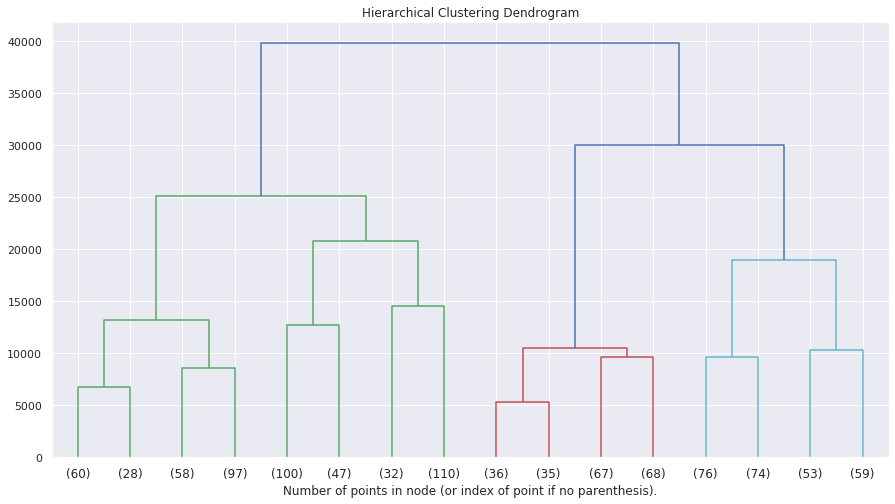

In [17]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

plt.figure(figsize=(15,8))
model = model.fit(X_train[:1000])
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

- The resulting dendrogram illustrates the process of hierachical clustering. Each cluster is represented as a branch, and branches below  other branches belong to the clustering of the upper branch, hence 'hierachical'.

---
## 2.2 Supervised classification of the training set
---

# Balancing Data
- Classification methods are likely to work better if the models are trained on balanced datasets (that is, that the classes that the model is trying to predict are balanced in frequency). Without balancing, the model is likely to missclassify less frequent classes, since it has less information about these classes and is penalized less for missclassifying them since there are fewer of them (in the case that we are using accuracy as a performance metric).

- The size of the classes also has to be decided. If the size is too large (so many classes will be oversampled), the model will tend to overfit, since repeated values of smaller classes are trained on. If the size is too small (so many classes will be undersampled), then useful data might be removed, and the model might not describe the data as well, and will perform poorly on both in-sample and out-of-sample data. 
- The training datasets should be **balanced inside the cross-validation splits**, so that each training set for each fold is balanced separately, and the validation set for each fold is not balanced, so that the evaulation is more realistic. This is important since **if the dataset is balanced before cross validation, then the validation set will be balanced**. However this **is not the desired validation set**, since we should assume that real out-of-sample data has a similar distribution of classes to the unbalanced training data.


In [0]:
def balance_data(X, y, size=1400):
    # Combine X and y
    temp = X.join(y, how='outer')

    # Divide by class
    class_range = range(10)
    classes = [temp[temp['rating'] == i] for i in class_range]
    min_size = min([len(i) for i in train_classes])
    max_size = max([len(i) for i in train_classes])

    train_classes_bal = []
    for train_class in train_classes:
        if size > len(train_class):
            # Oversample with replacement
            replace = True
        else:
            # Undersample without replacement
            replace = False

        # Balance classes
        # Set random state for reproducibility of results
        train_classes_bal.append(train_class.sample(size, replace=replace, random_state=42).reset_index().drop(columns=['index']))
        train_balanced = pd.concat([i for i in train_classes_bal])

    # Split into X_train and y_train
    X_train = train_balanced[predictors]
    y_train = train_balanced['rating']

    return X_train, y_train

## 2.2.1 MLP neural network supervised classification
---

- An MLP Neural Network will be trained as a classifier for the fashion image dataset using the architecture as in the assignment:

In [0]:
# Define the MLP neural network
class NeuralNet(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes, dropout=0):
        self.dropout = dropout
        super(NeuralNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.fc4 = nn.Linear(hidden_size, num_classes)
    
    def forward(self, x):
        out = F.relu(self.fc1(x))
        out = F.relu(self.fc2(out))
        out = F.relu(self.fc3(out))
        out = self.fc4(out)
        out = F.log_softmax(out, dim=1)
        return out

In [0]:
# Setup parameters
hidden_size = 100
input_size = X_train.shape[1]
num_classes = y_train.shape[0]
learning_rate = 0.005
batch_size = 128
num_epochs = 30

# Create new instance of the NN
net = NeuralNet(input_size=X_train.shape[1], hidden_size=100, num_classes=y_train.shape[0])

# Define Loss as Negative Log-Likelihood
criterion = nn.NLLLoss()

# Use Stochastic Gradient Descent for the optimizer
optimiser = torch.optim.SGD(net.parameters(), lr=learning_rate) 

# Create a tensor data set
# X_train, X_val = torch.from_numpy(X_train).float(), torch.from_numpy(X_val).float()
# y_train, y_val = torch.from_numpy(np.array(y_train)).float(), torch.from_numpy(np.array(y_val)).float()
X_train_tens = torch.from_numpy(X_train).float()
y_train_tens = torch.from_numpy(np.array(y_train)).float()

X_test_tens = torch.from_numpy(X_test).float()
y_test_tens = torch.from_numpy(np.array(y_test)).float()

# Load data
train = torch.utils.data.TensorDataset(X_train_tens, y_train_tens)
train_loader = torch.utils.data.DataLoader(train, batch_size=batch_size, shuffle=True)

test = torch.utils.data.TensorDataset(X_test_tens, y_test_tens)
test_loader = torch.utils.data.DataLoader(test, batch_size=batch_size, shuffle=True)

# Train the model
total_step = len(train_loader)
loss_values = []

for epoch in range(num_epochs+1):
    print(epoch)
    ###################
    # train the model #
    ###################
    net.train()
    train_loss = 0.0
    
    for i, (cars, labels) in enumerate(train_loader, 0):
        
        # reshape to long vector
        cars = cars.reshape(-1, 784)
        labels = labels.squeeze_().type(torch.LongTensor)
            
        # forward pass
        outputs = net(cars)
        loss = criterion(outputs, labels)
            
        # backward and optimise
        optimiser.zero_grad()
        loss.backward()
        optimiser.step()

        # Compute training loss
        train_loss += loss.item()

    # Store loss at each epoch
    loss_values.append(train_loss)

# Calculate test metrics after fully training nn
net.eval()
correct = 0
total = 0
y_test_pred = []
y_test = []
for cars, labels in test_loader:
    cars = cars.reshape(-1, 784)
    labels = labels.squeeze_().type(torch.LongTensor)
    outputs = net(cars)
    _, predicted = torch.max(outputs.data, 1)
    total += labels.size(0)
    correct += (predicted == labels).sum().item()
    y_test_pred += predicted.tolist()
    y_test += labels.tolist()

# Calculate metrics
accuracy = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred, average='macro')
recall = recall_score(y_test, y_test_pred, average='macro')
f1 = f1_score(y_test, y_test_pred, average='macro')


Note that Shuffle = True within the DataLoaders. This is to ensure that at each epoch, the neural network is fed in the data in different orders.

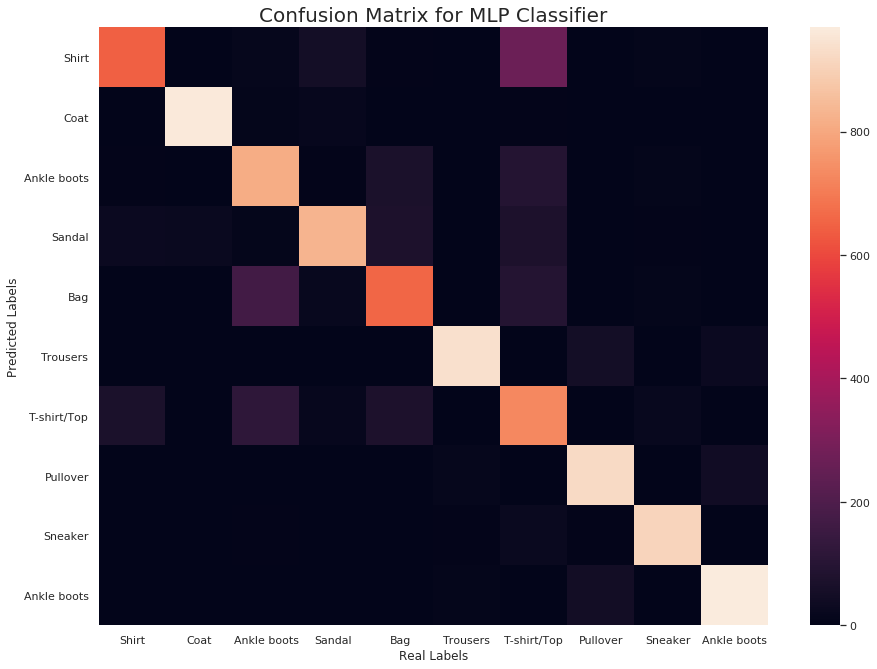

In [85]:
# Plot heatmap
fig = plt.figure(figsize=(15,11))
labels = [fashion_map[int(x)] for x in fashion_kmeans_labels]
sns.heatmap(confusion_matrix(y_test, y_test_pred), xticklabels=labels, yticklabels=labels)
plt.title('Confusion Matrix for MLP Classifier', fontsize=20)
plt.xlabel('Real Labels')
plt.ylabel('Predicted Labels')
plt.show()

In [89]:
# Populate metrics table
df_table = pd.DataFrame(columns=['Test Set Metrics', 'MLP Classifier'])
df_table.loc[0] = ['Accuracy', round(accuracy, 3)]
df_table.loc[1] = ['Precision', round(precision, 3)]
df_table.loc[2] = ['Recall', round(recall, 3)]
df_table.loc[3] = ['F1 Score', round(f1, 3)]
df_table

,Test Set Metrics,MLP Classifier
0,Accuracy,0.878
1,Precision,0.887
2,Recall,0.878
3,F1 Score,0.880


## 2.2.2 Convolutional neural network (CNN) supervised classification
---
- Convolutional neural networks are specifically for image classification, since they can preserve the spatial relationship between pixels. They are designed to identify low-level features of images, which combine into medium and high-level features in order to classify the images. 
- Filters are applied to the images in order to create a new 'convolved' matrix, which maps the image onto a smaller grid which preserves spatial relationships between pixels.
- The type and size of kernels used on the images will result in different convolved outputs of the images. These kernels or filters are learned by the network in order to learn different features of the image set, such as certain outlines of clothing that frequently occur in images.
- Pooling reduces feature size down. For example, max pooling takes the max of the filter. Note that clearly pooling also preserves spatial relationships.

Note that the padding is 0 in all convolutions.

In [0]:
# Define the CNN neural network
class ConvNet(nn.Module):
    def __init__(self, input_size, dropout=0, upscale=False, batch_norm=False, fc=False):
        self.input_size = input_size
        self.dropout = dropout
        self.upscale = upscale
        self.batch_norm = batch_norm
        self.fc = fc
        super(ConvNet, self).__init__()

        # add the layers
        self.layer0 = nn.Sequential(
            nn.Conv2d(1, 6, kernel_size=5, stride=2, dilation=1, padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        ) 
        if self.upscale:
            self.layer1 = nn.Sequential(
                nn.Conv2d(6, 6, kernel_size=5, stride=1, dilation=1, padding=0),
                nn.ReLU(),
                nn.MaxPool2d(kernel_size=2, stride=2)
            )
        else:
            self.layer1 = nn.Sequential(
                nn.Conv2d(1, 6, kernel_size=5, stride=1, dilation=1, padding=0),
                nn.ReLU(),
                nn.MaxPool2d(kernel_size=2, stride=2)
            )
        if self.batch_norm:
            self.layer2 = nn.Sequential(
                nn.Conv2d(6, 16, kernel_size=5, stride=1, dilation=1, padding=0),
                nn.ReLU(),
                nn.MaxPool2d(kernel_size=2, stride=2),
                nn.BatchNorm2d(16)
            )
        else:
            self.layer2 = nn.Sequential(
                nn.Conv2d(6, 16, kernel_size=5, stride=1, dilation=1, padding=0),
                nn.ReLU(),
                nn.MaxPool2d(kernel_size=2, stride=2)
            )

        if self.dropout:
            self.dropout = dropout
        if self.fc: 
            self.fc0 = nn.Linear(4*4*16, 240)
            self.fc1 = nn.Linear(240, 120)
        else:
            self.fc1 = nn.Linear(4*4*16, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)
    
    # forward 
    def forward(self, x):
        out = x
        if self.upscale:
            out = self.layer0(out)
        out = self.layer1(out)
        out = self.layer2(out)
        out = out.reshape(out.size(0), -1)
        if self.training:
            out = F.dropout(out, p=self.dropout)
        if self.fc:
            out = F.relu(self.fc0(out))
        out = F.relu(self.fc1(out))
        out = F.relu(self.fc2(out))
        out = self.fc3(out)
        out = F.log_softmax(out, dim=1)

        return out

In [0]:
def eval_CNN(X, y, X_test, y_test, k=5, dropout=0, upscale=False, batch_norm=False, fc=False, num_epochs=30):
    '''
    k=fold Stratified Cross Validation of CNN
    '''
    if upscale:
        p = 120
    else:
        p = 28
     
    # Set up CV
    if k is not None:
        skf = StratifiedKFold(n_splits=k, random_state=42, shuffle=True)
    else:
        # Unused skf
        skf = StratifiedKFold(n_splits=2, random_state=42, shuffle=True)

    # Setup parameters
    hidden_size = 100
    input_size = p
    num_classes = y.shape[0]
    learning_rate = 0.005
    batch_size = 128
    num_epochs = num_epochs

    # Create new instance of the NN
    net = ConvNet(input_size=input_size, dropout=dropout, upscale=upscale, batch_norm=batch_norm, fc=fc)

    # Define Loss as Negative Log-Likelihood
    criterion = nn.NLLLoss()

    # Use Stochastic Gradient Descent for the optimizer
    optimiser = torch.optim.SGD(net.parameters(), lr=learning_rate) 

    # Use stratified k-fold cross-validation to evaluate models
    if k is not None:
        skf_split = skf.split(X, y)
    else:
        skf_split = [(0, 0)]

    accuracy_train = []
    accuracy_val = []

    for train_index, val_index in skf_split:
        if k is not None:
            X_train, X_val = X[train_index], X[val_index]
            y_train, y_val = y[train_index], y[val_index]
        else:
            X_train, X_val = X, X
            y_train, y_val = y, y

        # Balance training set
        # X_train, y_train = balance_data(X_train, y_train)

        # Create a tensor data set
        X_train = X_train[:, None, :, :]
        X_val = X_val[:, None, :, :]
        X_test = X_test[:, None, :, :]

        X_train_tens, X_val_tens, X_test_tens = torch.from_numpy(X_train).float(), torch.from_numpy(X_val).float(), torch.from_numpy(X_test).float()
        y_train_tens, y_val_tens, y_test_tens = torch.from_numpy(np.array(y_train)).float(), torch.from_numpy(np.array(y_val)).float(), torch.from_numpy(np.array(y_test)).float()

        # Load data
        train = torch.utils.data.TensorDataset(X_train_tens, y_train_tens)
        train_loader = torch.utils.data.DataLoader(train, batch_size=batch_size, shuffle=True)

        val = torch.utils.data.TensorDataset(X_val_tens, y_val_tens)
        val_loader = torch.utils.data.DataLoader(val, batch_size=batch_size, shuffle=True)

        test = torch.utils.data.TensorDataset(X_test_tens, y_test_tens)
        test_loader = torch.utils.data.DataLoader(test, batch_size=batch_size, shuffle=True)

        # Train the model
        total_step = len(train_loader)
        loss_values = []

        for epoch in range(num_epochs+1):
            net.train()
            train_loss = 0.0
            
            for i, (image, labels) in enumerate(train_loader, 0):
                
                # reshape to long vector
                labels = labels.squeeze_().type(torch.LongTensor)
                    
                # forward pass
                outputs = net(image)
                loss = criterion(outputs, labels)
                    
                # backward and optimise
                optimiser.zero_grad()
                loss.backward()
                optimiser.step()

                # Compute training loss
                train_loss += loss.item()

            # Store loss at each epoch
            loss_values.append(train_loss)

        # Calculate training accuracy after fully training nn
        net.eval()
        correct = 0
        total = 0
        for image, labels in train_loader:
            labels = labels.squeeze_().type(torch.LongTensor)
            outputs = net(image)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        accuracy_train.append(correct/total)

        # Calculate validation accuracy after fully training nn
        net.eval()
        correct = 0
        total = 0
        for image, labels in val_loader:
            labels = labels.squeeze_().type(torch.LongTensor)
            outputs = net(image)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        accuracy_val.append(correct/total)

    # Calculate test accuracy after (when not using k-fold CV)
    net.eval()
    correct = 0
    total = 0
    y_test_pred = []
    y_test = []
    for image, labels in test_loader:
        labels = labels.squeeze_().type(torch.LongTensor)
        outputs = net(image)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        y_test_pred += predicted.tolist()
        y_test += labels.tolist()

    if k is not None:
        accuracy_test = None

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_test_pred)
    precision = precision_score(y_test, y_test_pred, average='macro')
    recall = recall_score(y_test, y_test_pred, average='macro')
    f1 = f1_score(y_test, y_test_pred, average='macro')

    print('Finished')
    return accuracy_train, accuracy_val, accuracy, precision, recall, f1


- The unoptimized CNN is now trained on the images:

In [0]:
# Train the CNN
accuracy_train, accuracy_val, accuracy, precision, recall, f1 = eval_CNN(X_train_mat, y_train, X_test_mat, y_test, k=None, 
        dropout=False, upscale=False, batch_norm=False, fc=False, num_epochs=30)

In [96]:
# Populate metrics table
df_table = pd.DataFrame(columns=['Test Set Metrics', 'CNN Classifier'])
df_table.loc[0] = ['Accuracy', round(accuracy, 3)]
df_table.loc[1] = ['Precision', round(precision, 3)]
df_table.loc[2] = ['Recall', round(recall, 3)]
df_table.loc[3] = ['F1 Score', round(f1, 3)]
df_table

,Test Set Metrics,CNN Classifier
0,Accuracy,0.886
1,Precision,0.877
2,Recall,0.868
3,F1 Score,0.877


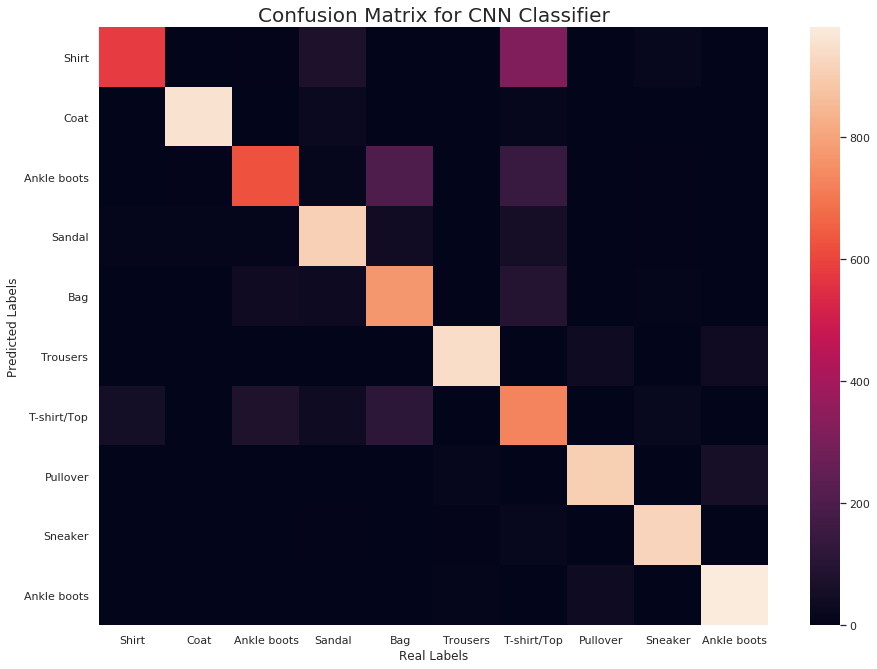

In [51]:
fig = plt.figure(figsize=(15,11))
labels = [fashion_map[int(x)] for x in fashion_kmeans_labels]
sns.heatmap(confusion_matrix(y_test, y_test_pred), xticklabels=labels, yticklabels=labels)
plt.title('Confusion Matrix for CNN Classifier', fontsize=20)
plt.xlabel('Real Labels')
plt.ylabel('Predicted Labels')
plt.show()

## 2.2.3 Comparisons of the classifiers
---


- From the metrics derived above for both the MLP and the CNN, the CNN performs slightly better without optimization of any of the classifiers. 

- There are a few reasons why the CNN classifier would be expected to perform better than the MLP Classifer.

- Firstly, the CNN's architecture allows it to preserve spatial correlations between pixels in the image, since the inputs are 2D and the convoluational layers help to learn more meaningful features from the image.

- The default CNN also has fewer parameters than the defaul MLP classifier, which in turn means that it is less prone to overfitting. In the MLP classifier, each pixel in the input vector becomes a parameter.

- In the CNN, pooling provides two main benefits:
    - It uses down-sampling to reduce the number of parameters
    - It decreases the sensitivity to changes in scale and orientation of the image.
    
This is achieved using a sliding window across the image, which maps the image onto a smaller image with a particular function. For example, a 2x2 window could map 4 pixels onto just 1 pixel by taking the maximum greyscale value of the 4 pixels; this would be called max pooling, and the stride is of size 2.

- Most of these factors point to CNN being a better model choice for image classification.


## Supervised vs Unsupervised Learning
- Since unsupervised learning doesn't use ground-truth labels and so can't train on these labels, the accuracy from these methods is clearly going to be lower.
- Unsupervised learning methods however provide a powerful way to cluster, model or classify data without much input. In the case of the unsupervised kNN classifier that used the kmeans clustering, it achieved an accuracy of nearly 60% which is quite impressive.

### Interpretability of Results
- The MLP and CNN classifiers end up with a lot of trained parameters. This drastically reduces the interpretibility of the networks, so that there are basically 'black boxes'.

- In contrast to this, the unsupervised kmeans clustering (and as an extension, the kNN classifier) was able to generate 10 centroids that intuitively matched roughly to the 10 labels in the data, so it is much more informative of how it is trying to classify the data. 

- In the case of the CNN, the features it has learned may be intuitive, such as learning specific shapes of edges of different types of clothing. It would be interesting to visualise these features as an extension.

### Upscaling of images
- The images are upscaled to 'artificially' increase the resolution by interpolating across pixels to find the greyscale values inbetween. 

- The purpose of this is to allow the addition of an extra convolutional layer. In this way, the hope is that the model learns more features from the larger, 'higher' resolution images (since the size of the kernel stays the same).

- The images are also fed into the CNN as 2D images this time.

In [0]:
X_train_mat = np.array([x.reshape(28,28) for x in X_train])
X_test_mat = np.array([x.reshape(28,28) for x in X_test])

X_train_upscaled = np.array([scipy.ndimage.zoom(x,120/28) for x in X_train_mat])
X_test_upscaled = np.array([scipy.ndimage.zoom(x,120/28) for x in X_test_mat])

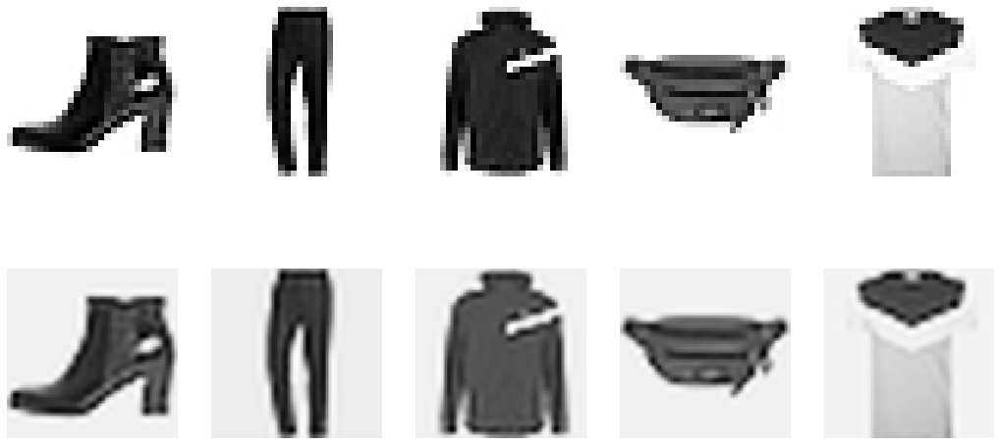

In [45]:
fig, axes = plt.subplots(2, 5, figsize=(18,9))

for i in range(5):
    axes[0, i].imshow(X_train_mat[i], cmap='Greys')
    axes[1, i].imshow(X_train_upscaled[i], cmap='Greys')
    axes[0, i].axis('off')
    axes[1, i].axis('off')
plt.show()

In [71]:
# Perform a grid search to optimize CNN using k-Fold Stratified Cross Validation
dropouts = [0.1, 0.3]
upscales = [True, False]
batch_norms = [True, False]
fcs = [True, False]

max_acc = 0
best_model = None
for dropout in dropouts:
  for upscale in upscales:
      for batch_norm in batch_norms:
          for fc in fcs:
            model = (dropout, upscale, batch_norm, fc)
            print(model)
            # Use upscaled images if needed
            if upscale:
                X_train_active = X_train_upscaled
                X_test_active = X_test_upscaled
            else:
                X_train_active = X_train_mat
                X_test_active = X_test_mat

            accuracy_train, accuracy_val, accuracy, precision, recall, f1 = eval_CNN(X_train_active, y_train, X_test_active, y_test, k=5, 
                    dropout=dropout, upscale=upscale, batch_norm=batch_norm, fc=fc, num_epochs=30)

            # check if average validation score is higher than best model
            if accuracy_val[-1] > max_acc:
                best_model = model
                max_acc = accuracy_val[-1]

(0.1, True, True, True)
Finished
(0.1, True, True, False)
Finished
(0.1, True, False, True)
Finished
(0.1, True, False, False)
Finished
(0.1, False, True, True)
Finished
(0.1, False, True, False)
Finished
(0.1, False, False, True)
Finished
(0.1, False, False, False)
Finished
(0.3, True, True, True)
Finished
(0.3, True, True, False)
Finished
(0.3, True, False, True)
Finished
(0.3, True, False, False)
Finished
(0.3, False, True, True)


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Finished
(0.3, False, True, False)
Finished
(0.3, False, False, True)
Finished
(0.3, False, False, False)
Finished


In [103]:
# Train model with best architecture found through 5-fold Stratified Cross Validation
dropout, upscale, batch_norm, fc = best_model
print(best_model)
accuracy_train, accuracy_val, accuracy, precision, recall, f1 = eval_CNN(X_train_upscaled, y_train, X_test_upscaled, y_test, k=None, dropout=dropout, 
                upscale=upscale, batch_norm=batch_norm, fc=fc, num_epochs=30)

(0.3, True, True, True)


In [102]:
# Populate metrics table
df_table = pd.DataFrame(columns=['Test Set Metrics', 'Optimised CNN Classifier'])
df_table.loc[0] = ['Accuracy', round(accuracy, 3)]
df_table.loc[1] = ['Precision', round(precision, 3)]
df_table.loc[2] = ['Recall', round(recall, 3)]
df_table.loc[3] = ['F1 Score', round(f1, 3)]
df_table

,Test Set Metrics,Optimised CNN Classifier
0,Accuracy,0.9090
1,Precision,0.8990
2,Recall,0.8476
3,F1 Score,0.9020


### CNN Improvements
- Including Dropout regularization reduces the overfitting of the CNN model. It achieves this because some of the weights are set to zero randomly, which increases the indepedance of the training of the weights, leading to less overfitting.
- The addition of a convolutional layer was made easier by an upsampling of the images. In this way, the CNN model is able to learn more detailed features from the data, since the kernel size was kept the same and the images are larger in resolution.
- Including the batch normalization was found not to be that impactful on the test accuracy, but it slightly decreases training time.
- Adding another fully connected layer decreases the jump to the first fully connected layer, which was also found to increase the test accuracy.

- The final model uses a dropout of 0.3, and includes the extra fully-connected layer, the upscaling of images and the extra convolutional layer.